In [260]:
import numpy as np
import matplotlib.pyplot as plt
import random
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import preprocessing
import pandas as pd
from scipy import stats, signal

In [7]:
plt.rcParams.update({'font.size': 18})

# Exercício 2

In [66]:
activity_labels = ["Stand", 
                   "Sit", 
                   "Sit and Talk", 
                   "Walk", 
                   "Walk and Talk", 
                   "Climb Stair", 
                   "Climb Stair & talk",
                   "Stand to Sit", 
                   "Sit to Stand", 
                   "Stand to Sit & talk", 
                   "Sit to Stand & talk", 
                   "Stand to walk", 
                   "Walk to stand", 
                   "Stand to climb stairs & talk", 
                   "Climb stairs to walk", 
                   "Climb stairs & talk to walk & talk"]

colunas = ["Id","ACC_X","ACC_Y","ACC_Z","GYRO_X","GYRO_Y","GYRO_Z","MAGN_X","MAGN_Y","MAGN_Z","TimeStamp"]

In [324]:
#importação de dados.

def import_data():
    """Import all the data into a list of 15 numpy 2D arrays.
       Each matrix represent the data collected from 1 participant."""
    
    data = []
    for i in range(0, 15):
        dataPart = read_file(i, 1)
        if i ==0:
            data_total = dataPart[:,:10]
        else:
            data_total = np.concatenate((data_total, dataPart[:,:10]), axis=0)
        for j in range(2, 6):
            dataPart = np.concatenate((dataPart, read_file(i, j)), axis=0)
            data_total = np.concatenate((data_total, dataPart[:,:10]), axis=0)
        data.append(dataPart)
        
    return data,data_total

def read_file(numPart, numDev):
    "Read dataset from file, which represent the data collected from one device in one participant"
    
    filePath = "dataset/part" + str(numPart) + "/part" + str(numPart) + "dev" + str(numDev) + ".csv"
    data = np.genfromtxt(filePath, delimiter=',')
    return data

In [271]:
data,data_pandas = import_data()
data_panda = pd.DataFrame(data_pandas,columns=colunas)

In [11]:
# Divisão dos dados.

def divide_by_activities(data):
    "Divide data by activities."
    
    activities = []
    
    for i in range(len(data)):
        for j in range(1,17):
            indices = np.where(data[i][:,11]==j)
            if i == 0:
                activities.append(data[i][indices])
            else:
                activities[j-1]=np.concatenate((activities[j-1], data[i][indices]), axis=0)
    
    return activities

def divide_by_variable(data):
    "Divide activities by variable (accel., giros., magnit.)."

    acceleration = []
    giroscope = []
    magnetometer = []
    for i in range(16):
        acceleration.append(data[i][:,1:4])
        giroscope.append(data[i][:,4:7])
        magnetometer.append(data[i][:,7:10])

    return acceleration, giroscope, magnetometer

In [12]:
activities = divide_by_activities(data)
acceleration, gyroscope, magnetometer = divide_by_variable(activities)

In [13]:
# Módulos da feature para cada atividade.

def module_feature(feature):    
    "Calculate the module of vector t"
    
    feature_module = []
    for t in feature:
        feature_module.append(np.sqrt(t[:,0]**2 + t[:,1]**2 + t[:,2]**2))
    
    return feature_module

In [14]:
m_acceleration = module_feature(acceleration)
m_gyroscope = module_feature(gyroscope)
m_magnetometer = module_feature(magnetometer)

# Exercício 3.1

In [190]:
# Visualizar outliers com Boxplots.

def boxplot_features(m_acceleration, m_gyroscope, m_magnetometer):
    "Visualize boxplot of the vector modules."
    
    plt.figure(figsize=[30,20])

    # ----- Acceleration
    plt.subplot(131)
    plt.boxplot(m_acceleration)
    plt.xticks(np.arange(1,17), activity_labels, rotation=90)
    plt.title("Accelerator")
    plt.ylabel("Acceleration")
    
    # ----- Angular Velocity
    plt.subplot(132)
    plt.boxplot(m_gyroscope)
    plt.xticks(np.arange(1,17), activity_labels, rotation=90)
    plt.title("Gyroscope")
    plt.ylabel("Angular Velocity")
    
    # ----- Magnetic Field Variation
    plt.subplot(133)
    plt.boxplot(m_magnetometer)
    plt.xticks(np.arange(1,17), activity_labels, rotation=90)
    plt.title("Magnetometer")
    plt.ylabel("Magnetic Field Variation")
    
    plt.show()

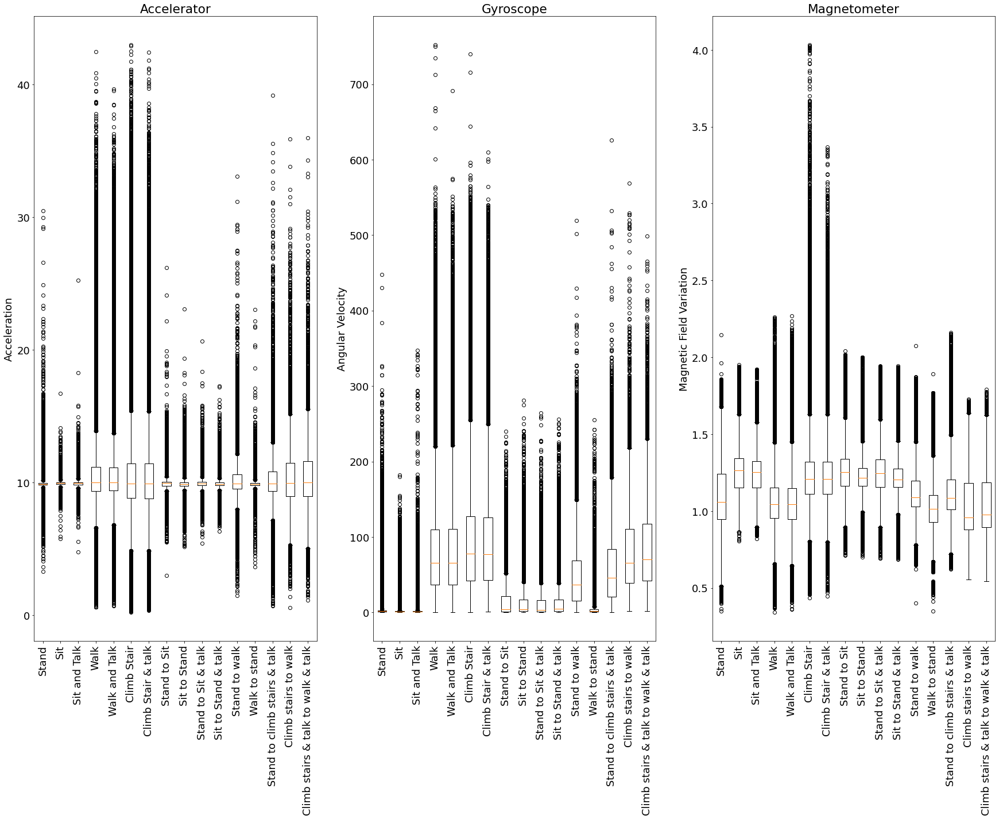

In [191]:
boxplot_features(m_acceleration, m_gyroscope, m_magnetometer)

# Exercício 3.2

In [123]:
# Obter dados coletados por um só dispositivo.

def get_by_device(data, device):
    "Get data collected by a single device."
    
    device_data = []

    for i in range(len(data)):
        device_data.append(data[0][data[0][:,0] == device])

    return device_data

In [187]:
# Obter densidades de outliers.

def outlier_density(t):
    "Calcular densidade de outliers do vetor t."
    
    q1 = np.quantile(t,0.25)
    q3 = np.quantile(t,0.75)
    ipr = q3-q1

    upper_limit = q3+(1.5*ipr)
    lower_limit = q1-(1.5*ipr)
    
    n_outlier = len(t[(t > upper_limit) | (t < lower_limit)])
    nr = len(t)
    return (n_outlier/nr) * 100

def variable_outlier_density(feature):
    "Calcular densidade de outliers de uma feature para todas as atividades."
    
    outlier_densities = []
    m_feature = module_feature(feature)
    for t in m_feature:
        outlier_densities.append(outlier_density(t))
    
    return outlier_densities

def plot_outlier_density(acceleration, gyroscope, magnetometer):
    "Visualizar bar plots de densidades de outliers para os 3 sensores e as diferentes atividades."

    plt.figure(figsize=[30,10])

    # ----- Acceleration
    plt.subplot(131)
    plt.bar(activity_labels, variable_outlier_density(acceleration))
    plt.xticks(rotation=90)
    plt.title("Accelerator")
    plt.ylabel("Outlier Density")

    # ----- Angular Velocity
    plt.subplot(132)
    plt.bar(activity_labels, variable_outlier_density(gyroscope))
    plt.xticks(rotation=90)
    plt.title("Gyroscope")
    plt.ylabel("Outlier Density")
   
    # ----- Magnetic Field Variation
    plt.subplot(133)
    plt.bar(activity_labels, variable_outlier_density(magnetometer))
    plt.xticks(rotation=90)
    plt.title("Magnetometer")
    plt.ylabel("Outlier Density")
    
    plt.show()

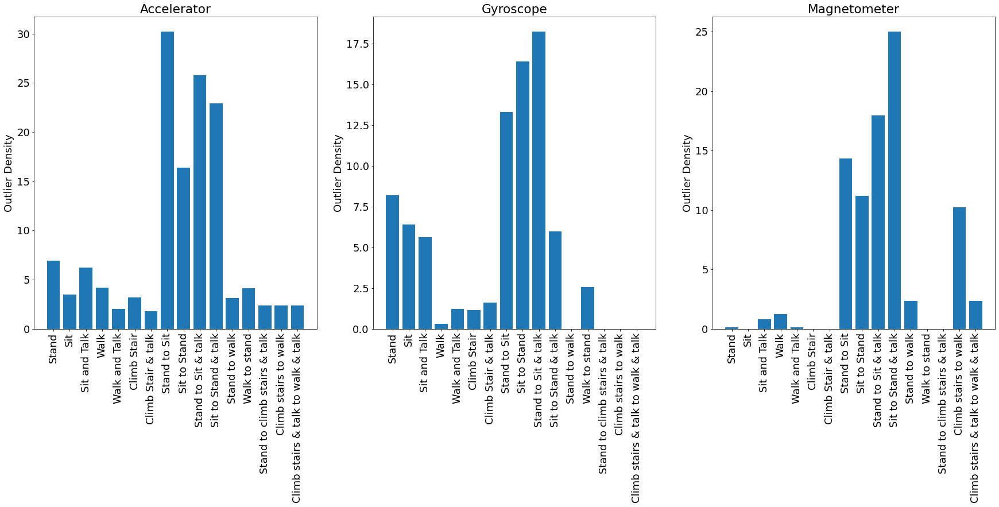

In [188]:
right_pulse_data = get_by_device(data, 2)
rp_acceleration, rp_gyroscope, rp_magnetometer = divide_by_variable(divide_by_activities(right_pulse_data))
plot_outlier_density(rp_acceleration, rp_gyroscope, rp_magnetometer)

- Nos 3 módulos dos vetores de aceleração, giroscópio e magnetómetro, observam-se densidades de outliers bastante superiores nas atividades de transição entre "Stand" e "Sit" e vice-versa ("Stand to Sit", "Sit to Stand", "Stand to Sit & Talk", "Sit to Stand & Talk"), sendo que no módulo do vetor de giroscópio, a atividade "Sit to Stand & Talk" apresenta um valor menor, mas ainda significativo. No módulo do vetor de magnetómetro, a atividade "Climb Stairs to Walk" apresenta um valor também superior.

- Em relação ao sensores, o de aceleração apresenta uma densidade de outliers maior que os restantes, pois todas as atividades apresentam existência de outliers e chegam até aos 30%.

# Exercício 3.3

In [30]:
# Determinar e Visualizar outliers com Z-score.

def outliers_zscore(sample,k):
    "Identify outliers using the Z-score method."

    mean = sample.mean()
    std = sample.std()
    new_values = (sample - mean)/std
    outliers = np.where(np.logical_or(new_values<-k,new_values>k))
    not_outliers = np.where(np.logical_and(new_values>=-k,new_values<=k))
    return outliers, not_outliers

def feature_outliers_zscore(module, k):
    outliers = []
    normals = []

    for i in range(len(module)):
        activity_outliers, activity_normals = outliers_zscore(module[i],k)
        outliers.append(module[i][activity_outliers])
        normals.append(module[i][activity_normals])

    return outliers, normals

# Exercício 3.4

In [194]:
def visualizacao_zscore(m_variable, title):
    "Visualize outliers identified with z-score."

    x = [i for i in range(0,16)]
    
    plt.figure(figsize=[30,20])
    
    # ----- K = 3
    plt.subplot(131)
    plt.title(f"{title} | k = 3")
    outliers, normals = feature_outliers_zscore(m_variable, 3)
    x_values_normals = [np.zeros_like(normals[i])+x[i] for i in range(0,16)]
    x_values_outliers = [np.zeros_like(outliers[i])+x[i] for i in range(0,16)]
    plt.plot(np.hstack(x_values_normals),np.hstack(normals),'x',color = 'blue')
    plt.plot(np.hstack(x_values_outliers),np.hstack(outliers),'x',color = 'red')
    plt.xticks(x, activity_labels, rotation=90)
    plt.ylabel("Acceleration")

    # ----- K = 3.5
    plt.subplot(132)
    plt.title(f"{title} | k = 3.5")
    outliers, normals = feature_outliers_zscore(m_variable, 3.5)
    x_values_normals = [np.zeros_like(normals[i])+x[i] for i in range(0,16)]
    x_values_outliers = [np.zeros_like(outliers[i])+x[i] for i in range(0,16)]
    plt.plot(np.hstack(x_values_normals),np.hstack(normals),'x',color = 'blue')
    plt.plot(np.hstack(x_values_outliers),np.hstack(outliers),'x',color = 'red')
    plt.xticks(x, activity_labels, rotation=90)
    plt.ylabel("Angular Velocity")

    # ----- K = 4
    plt.subplot(133)
    plt.title(f"{title} | k = 4")
    outliers, normals = feature_outliers_zscore(m_variable, 4)
    x_values_normals = [np.zeros_like(normals[i])+x[i] for i in range(0,16)]
    x_values_outliers = [np.zeros_like(outliers[i])+x[i] for i in range(0,16)]
    plt.plot(np.hstack(x_values_normals),np.hstack(normals),'x',color = 'blue')
    plt.plot(np.hstack(x_values_outliers),np.hstack(outliers),'x',color = 'red')
    plt.xticks(x, activity_labels, rotation=90)
    plt.ylabel("Magnetic Field Variation")

    plt.show()

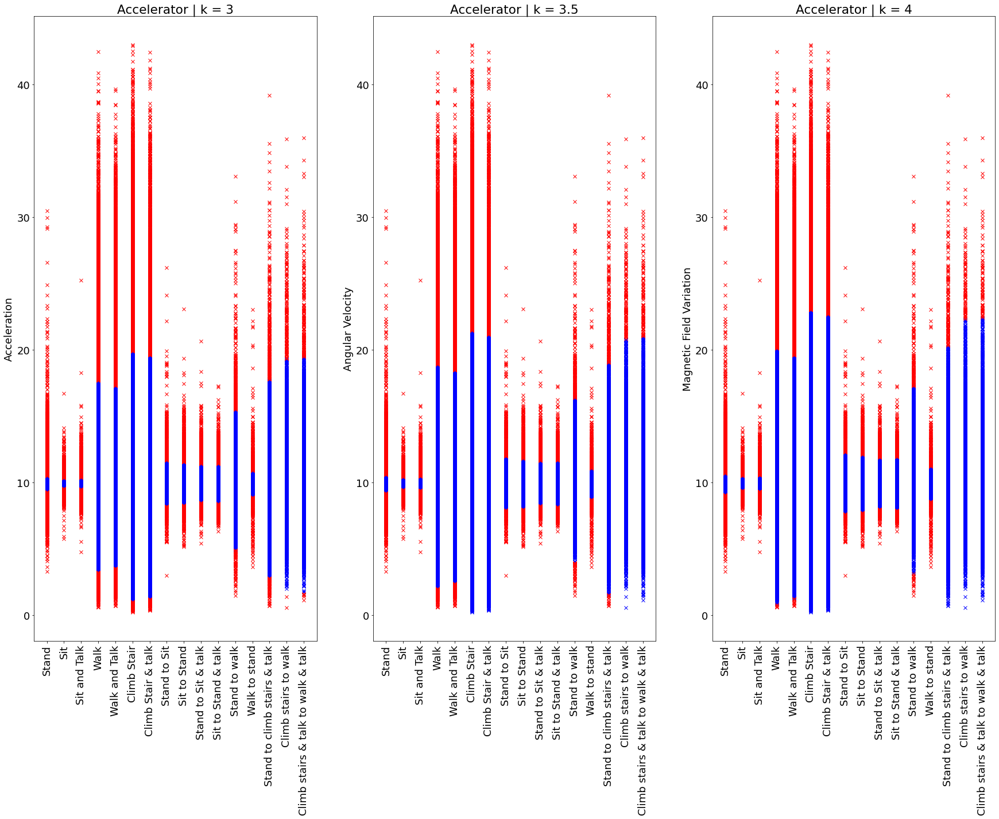

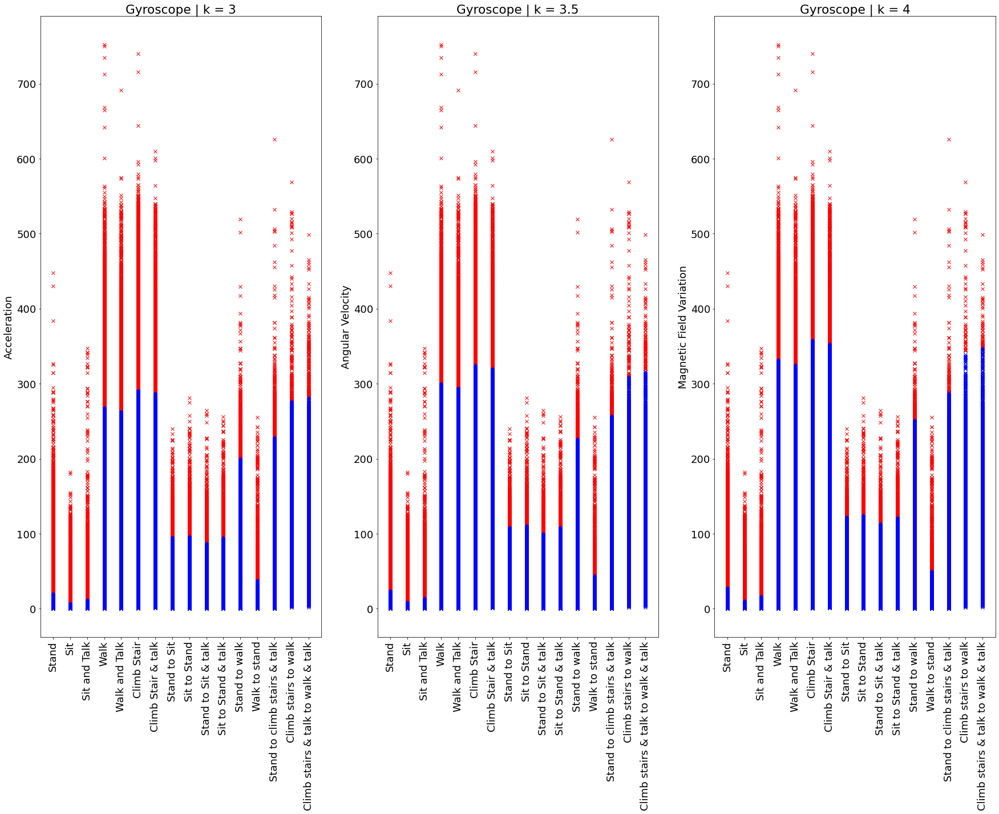

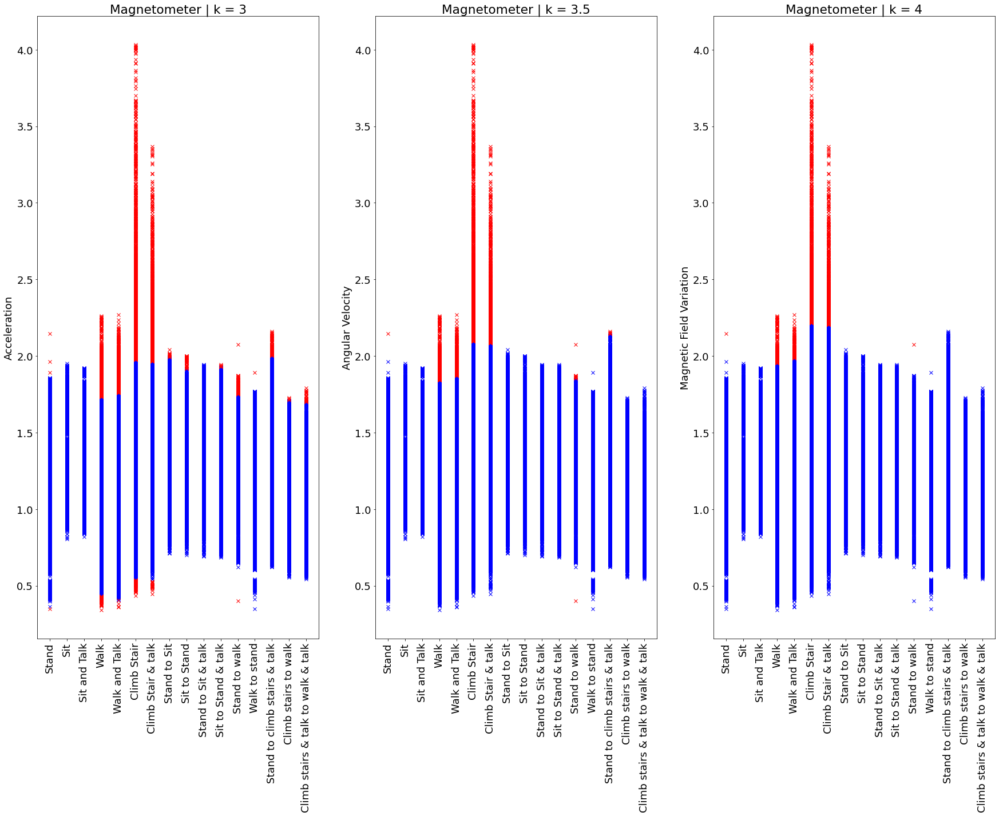

In [195]:
visualizacao_zscore(m_acceleration, "Accelerator")
visualizacao_zscore(m_gyroscope, "Gyroscope")
visualizacao_zscore(m_magnetometer, "Magnetometer")

- Pelos gráficos abaixo conseguimos observar que quanto maior o valor de k, menos são os valores designados de outliers, visto que quanto maior o k, maior o intervalo de valores aceite como não outliers.

# Exercício 3.5

In [196]:
def compare_boxplot_zscore(m_acceleration, m_gyroscope, m_magnetometer, k):
    "Visualize Boxplots and Z-score plots to compare both."
    
    x = [i for i in range(0,16)]
    
    plt.figure(figsize=[30,20])

    # ----- Acceleration
    plt.subplot(121)
    plt.boxplot(m_acceleration)
    plt.xticks(np.arange(1,17), activity_labels, rotation=90)
    plt.title("Accelerator")
    plt.ylabel("Acceleration")
    
    plt.subplot(122)
    plt.title(f"Accelerator | k = {k}")
    outliers, normals = feature_outliers_zscore(m_acceleration, k)
    x_values_normals = [np.zeros_like(normals[i])+x[i] for i in range(0,16)]
    x_values_outliers = [np.zeros_like(outliers[i])+x[i] for i in range(0,16)]
    plt.plot(np.hstack(x_values_normals),np.hstack(normals),'x',color = 'blue')
    plt.plot(np.hstack(x_values_outliers),np.hstack(outliers),'x',color = 'red')
    plt.xticks(x, activity_labels, rotation=90)
    
    # ----- Angular Velocity
    plt.figure(figsize=[30,20])
    
    plt.subplot(121)
    plt.boxplot(m_gyroscope)
    plt.xticks(np.arange(1,17), activity_labels, rotation=90)
    plt.title("Gyroscope")
    plt.ylabel("Angular Velocity")
    
    plt.subplot(122)
    plt.title(f"Gyroscope | k = {k}")
    outliers, normals = feature_outliers_zscore(m_gyroscope, k)
    x_values_normals = [np.zeros_like(normals[i])+x[i] for i in range(0,16)]
    x_values_outliers = [np.zeros_like(outliers[i])+x[i] for i in range(0,16)]
    plt.plot(np.hstack(x_values_normals),np.hstack(normals),'x',color = 'blue')
    plt.plot(np.hstack(x_values_outliers),np.hstack(outliers),'x',color = 'red')
    plt.xticks(x, activity_labels, rotation=90)
    
    # ----- Magnetic Field Variation
    plt.figure(figsize=[30,20])
    
    plt.subplot(121)
    plt.boxplot(m_magnetometer)
    plt.xticks(np.arange(1,17), activity_labels, rotation=90)
    plt.title("Magnetometer")
    plt.ylabel("Magnetic Field Variation")
    
    plt.subplot(122)
    plt.title(f"Magnetometer | k = {k}")
    outliers, normals = feature_outliers_zscore(m_magnetometer, k)
    x_values_normals = [np.zeros_like(normals[i])+x[i] for i in range(0,16)]
    x_values_outliers = [np.zeros_like(outliers[i])+x[i] for i in range(0,16)]
    plt.plot(np.hstack(x_values_normals),np.hstack(normals),'x',color = 'blue')
    plt.plot(np.hstack(x_values_outliers),np.hstack(outliers),'x',color = 'red')
    plt.xticks(x, activity_labels, rotation=90)
    
    plt.show()

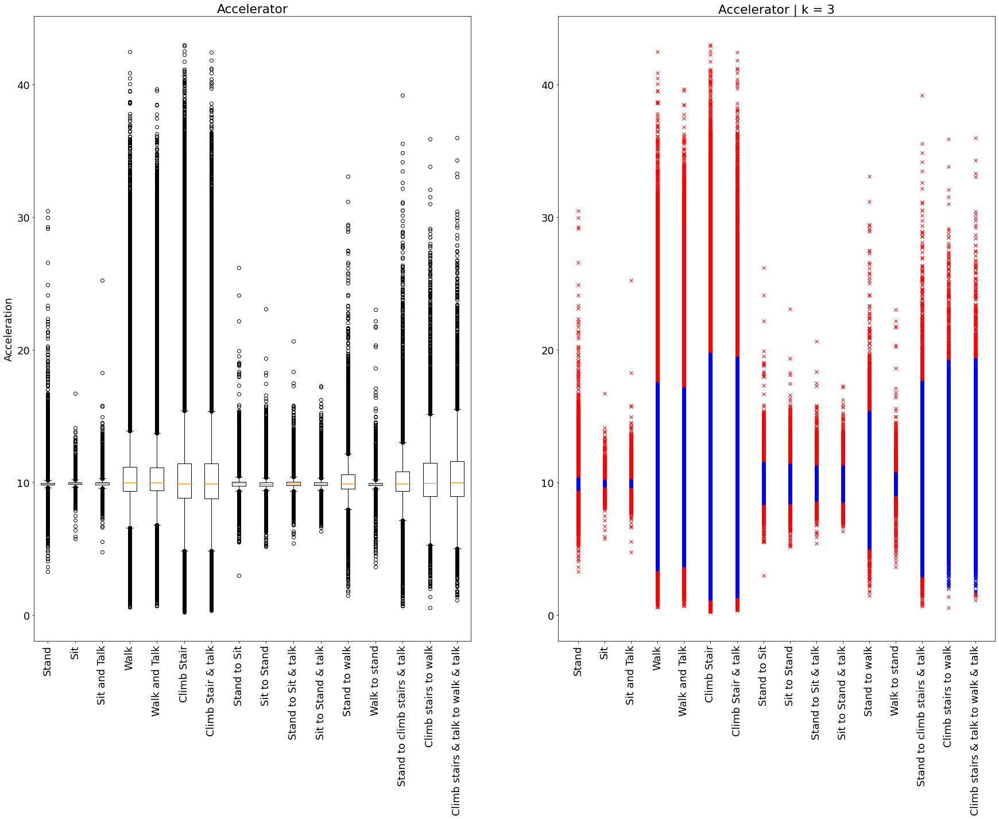

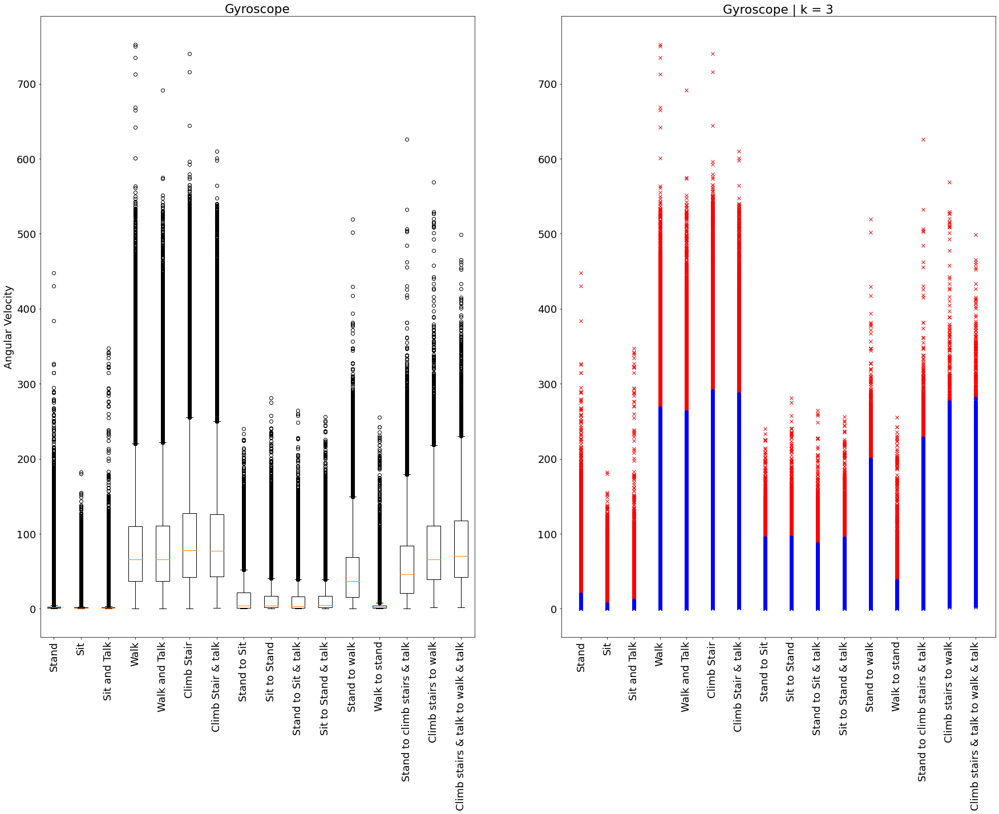

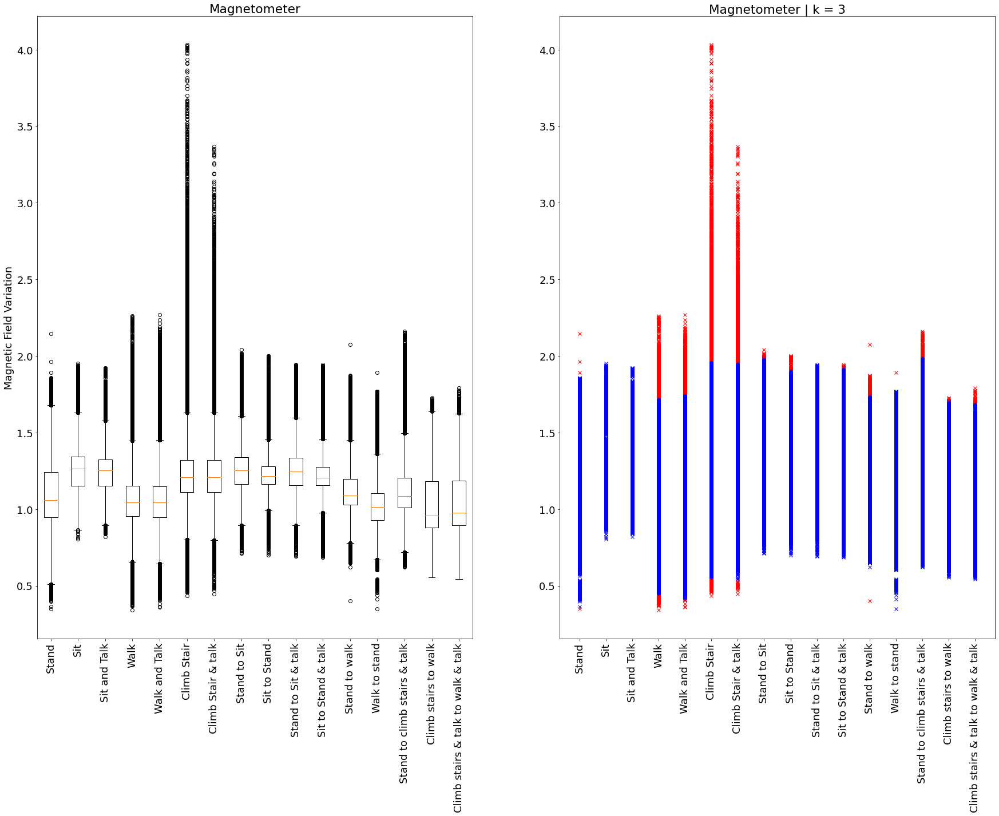

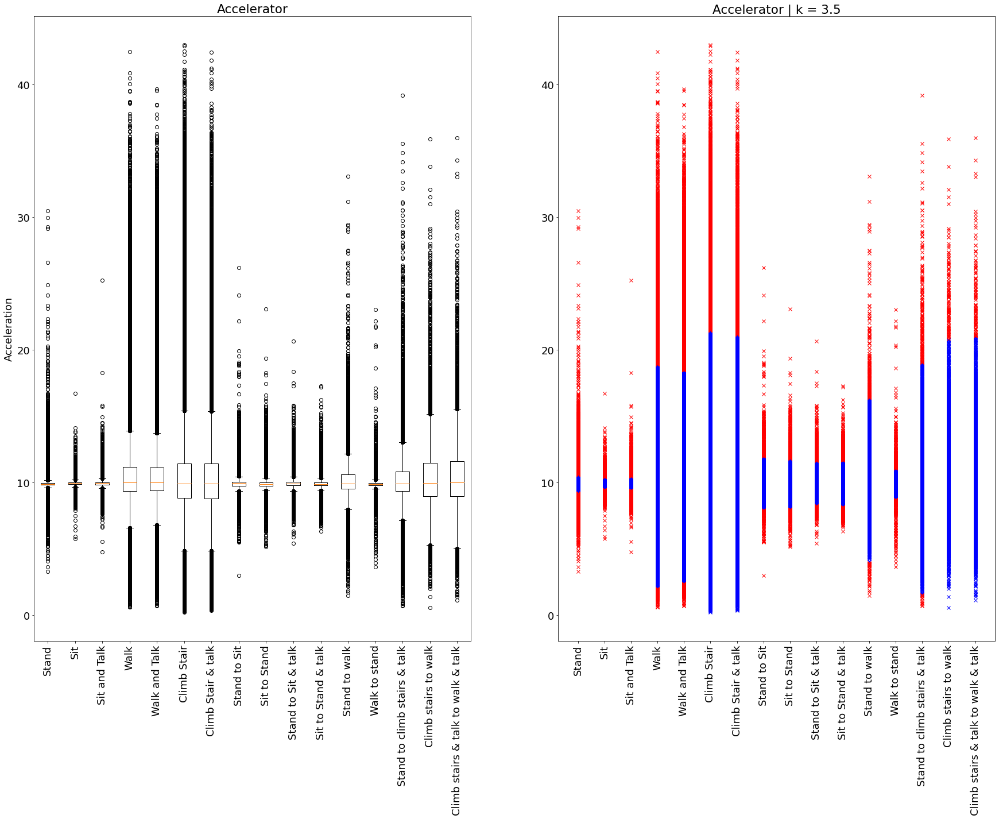

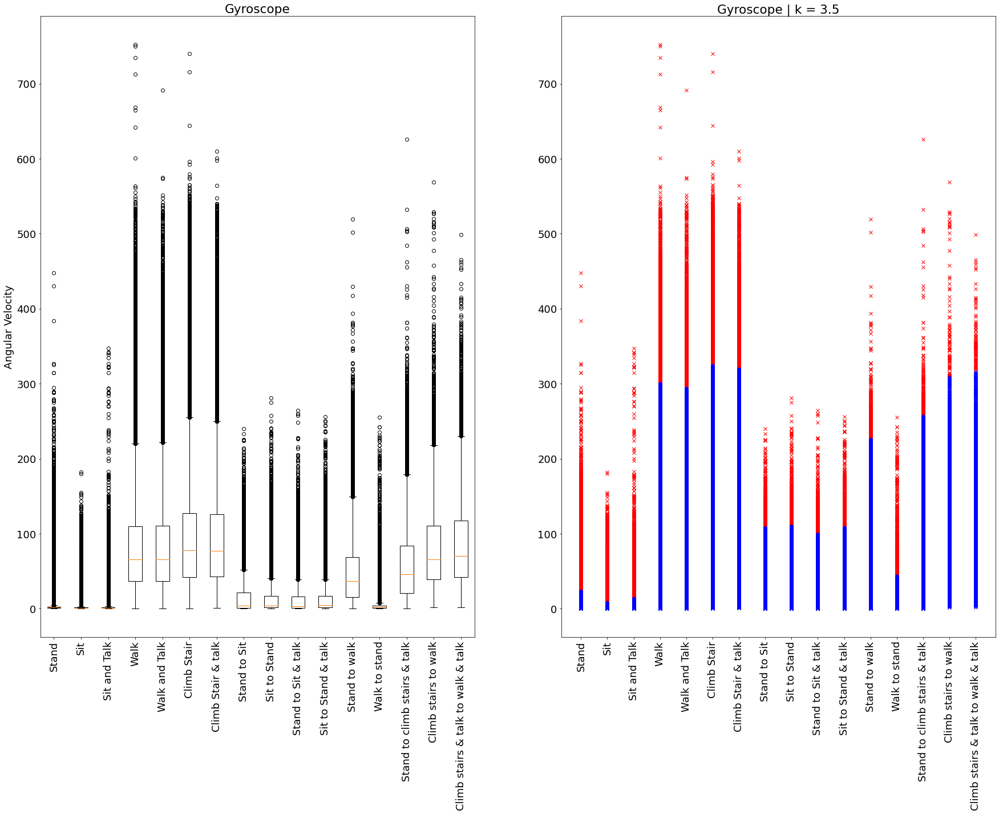

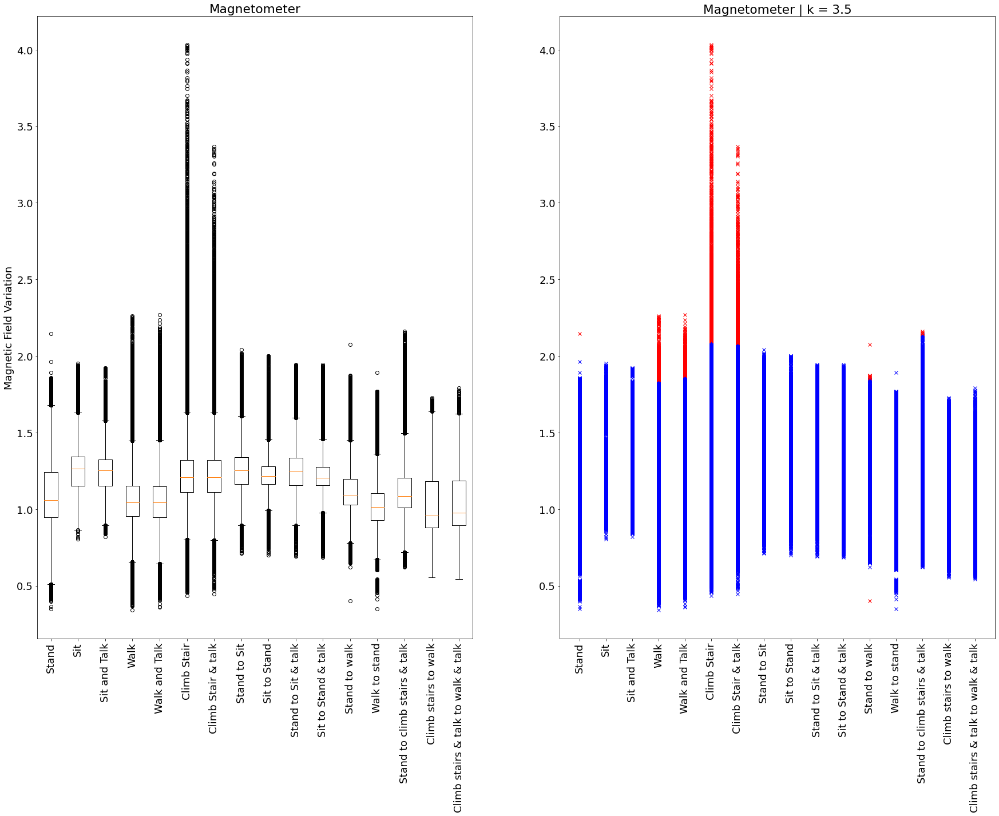

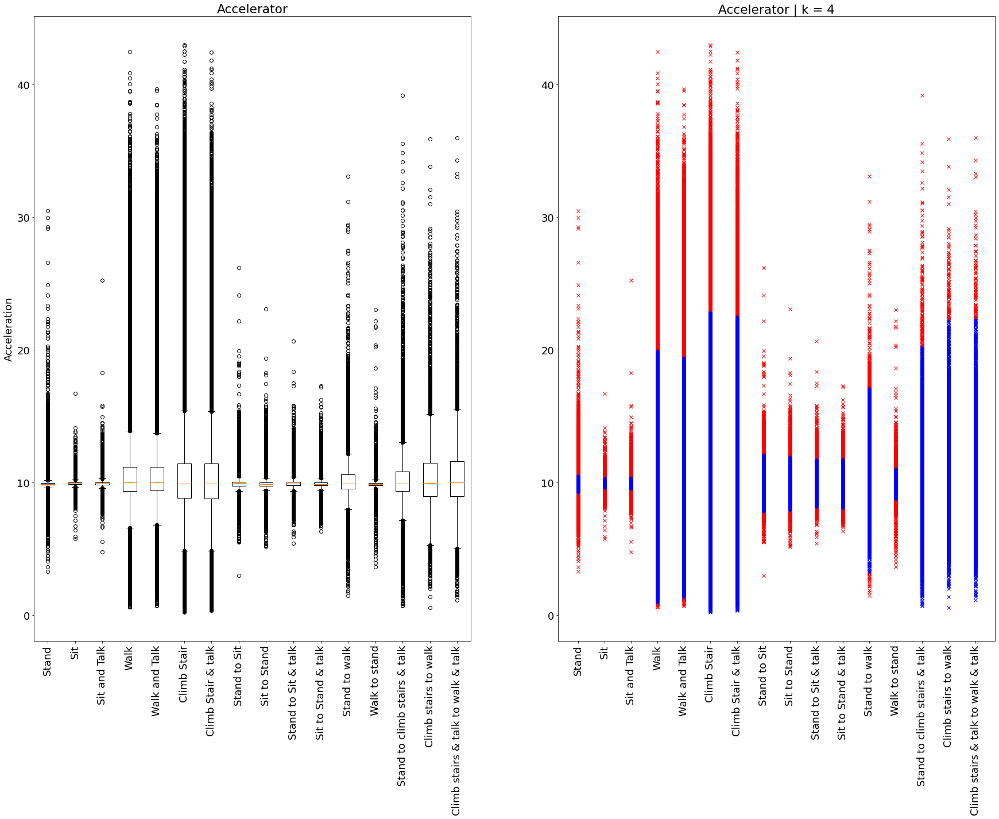

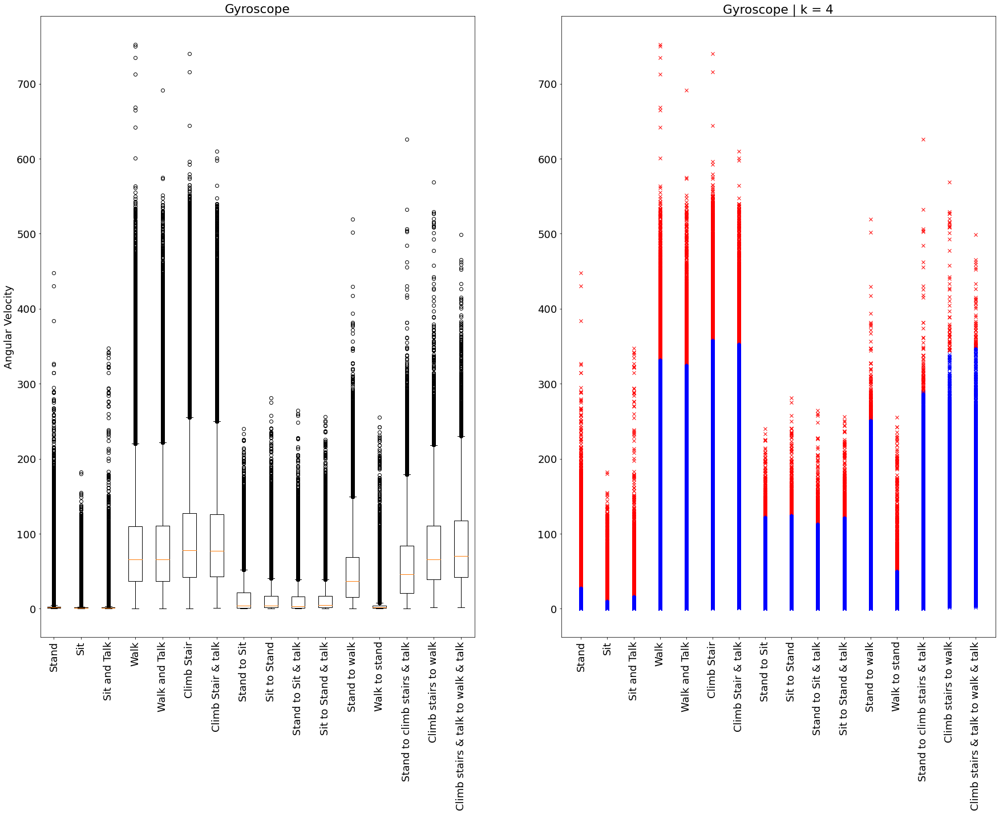

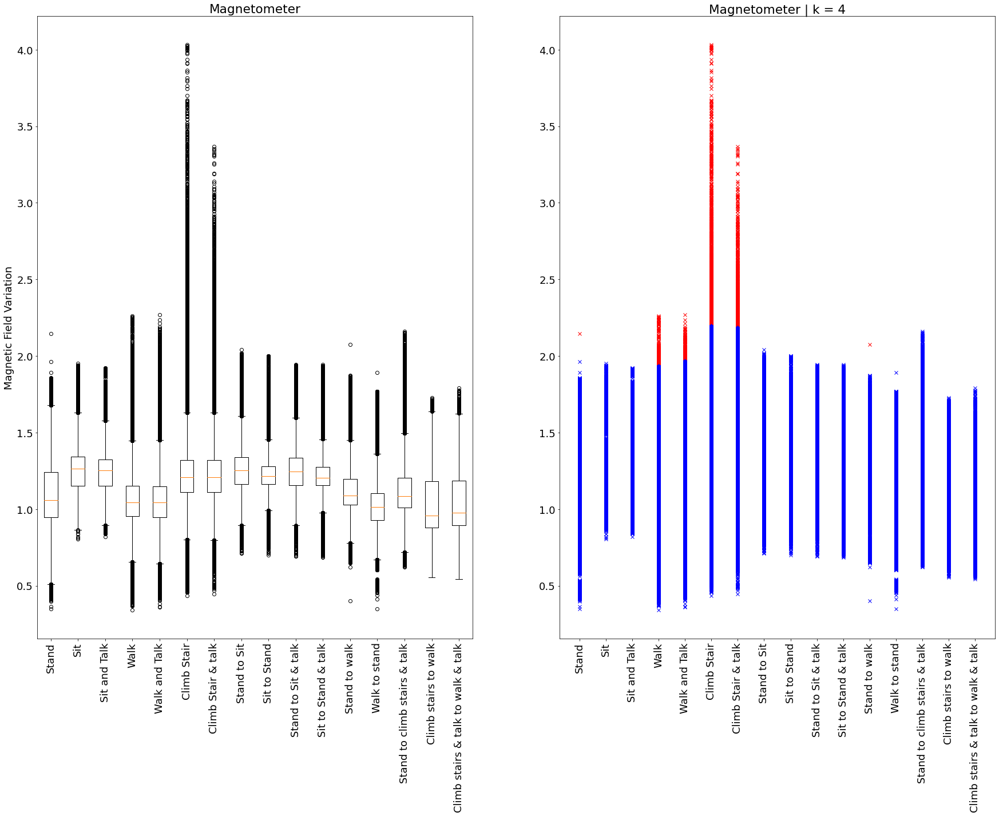

In [197]:
compare_boxplot_zscore(m_acceleration, m_gyroscope, m_magnetometer, 3)
compare_boxplot_zscore(m_acceleration, m_gyroscope, m_magnetometer, 3.5)
compare_boxplot_zscore(m_acceleration, m_gyroscope, m_magnetometer, 4)

In [28]:
def zscore_outlier_density(module, k):
    outlier_densities = []
    
    outliers, normals = feature_outliers_zscore(module, k)
    
    for i in range(len(module)):
        outlier_density = len(outliers[i])/len(module[i]) * 100
        outlier_densities.append(outlier_density)
    
    return outlier_densities

In [31]:
accel_zscore3 = zscore_outlier_density(m_acceleration, 3)
accel_zscore35 = zscore_outlier_density(m_acceleration, 3.5)
accel_zscore4 = zscore_outlier_density(m_acceleration, 4)

accel_zscore = [accel_zscore3, accel_zscore35, accel_zscore4]
    
gyros_zscore3 = zscore_outlier_density(m_gyroscope, 3)
gyros_zscore35 = zscore_outlier_density(m_gyroscope, 3.5)
gyros_zscore4 = zscore_outlier_density(m_gyroscope, 4)

gyros_zscore = [gyros_zscore3, gyros_zscore35, gyros_zscore4]
    
magnet_zscore3 = zscore_outlier_density(m_magnetometer, 3)
magnet_zscore35 = zscore_outlier_density(m_magnetometer, 3.5)
magnet_zscore4 = zscore_outlier_density(m_magnetometer, 4)

magnet_zscore = [magnet_zscore3, magnet_zscore35, magnet_zscore4]

In [198]:
# Plot de barras de densidade de outliers obtidas com Z-score para k = 3, 3.5 e 4.

def plot_outlier_densities_zscore(accel_zscore, gyros_zscore, magnet_zscore):
    
    x = np.array([i for i in range(0,16)])
    
    plt.figure(figsize=[30,10])
    
    ax = plt.subplot(131)
    plt.title("Accelerator")
    p_zscore3 = plt.bar(x, accel_zscore[0], label="Z-score K = 3", alpha=0.5)
    p_zscore35 = plt.bar(x, accel_zscore[1], label="Z-score K = 3.5", alpha=0.5)
    p_zscore4 = plt.bar(x, accel_zscore[2], label="Z-score K = 4", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    
    ax = plt.subplot(132)
    plt.title("Gyroscope")
    p_zscore3 = plt.bar(x, gyros_zscore[0], label="Z-score K = 3", alpha=0.5)
    p_zscore35 = plt.bar(x, gyros_zscore[1], label="Z-score K = 3.5", alpha=0.5)
    p_zscore4 = plt.bar(x, gyros_zscore[2], label="Z-score K = 4", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    
    ax = plt.subplot(133)
    plt.title("Magnetometer")
    p_zscore3 = plt.bar(x, magnet_zscore[0], label="Z-score K = 3", alpha=0.5)
    p_zscore35 = plt.bar(x, magnet_zscore[1], label="Z-score K = 3.5", alpha=0.5)
    p_zscore4 = plt.bar(x, magnet_zscore[2], label="Z-score K = 4", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    plt.show()

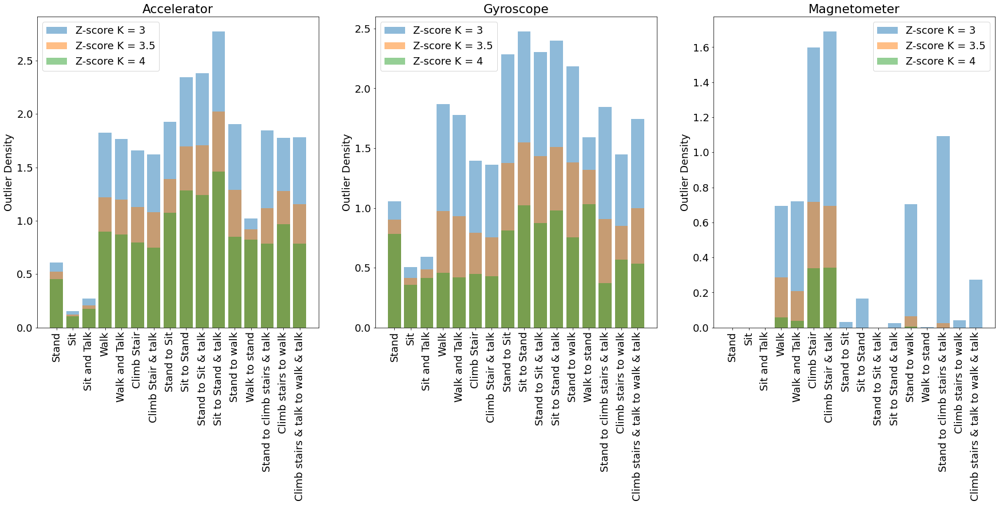

In [199]:
plot_outlier_densities_zscore(accel_zscore, gyros_zscore, magnet_zscore)

- Pelos gráficos acima, observamos que para um k menor, maior é a densidade de outliers em todas as atividades e os 3 sensores, menos, por vezes, quando a densidade de outliers é nula, o que confirma o que dissemos anteriormente.

In [75]:
accel_quantil = variable_outlier_density(acceleration)
gyros_quantil = variable_outlier_density(gyroscope)
magnet_quantil = variable_outlier_density(magnetometer)

vars_quantil = [accel_quantil, gyros_quantil, magnet_quantil]

In [202]:
# Plot de barras de densidade de outliers obtidas com Z-score para k = 3, 3.5 e 4 e Quartis.

def plot_outlier_densities_zscore_quantiles(accel_zscore, gyros_zscore, magnet_zscore, vars_quantil):
    
    x = np.array([i for i in range(0,16)])
    
    plt.figure(figsize=[30,10])
    
    ax = plt.subplot(131)
    plt.title("Accelerator")
    p_zscore3 = plt.bar(x, accel_zscore[0], label="Z-score K = 3", alpha=0.5)
    p_zscore35 = plt.bar(x, accel_zscore[1], label="Z-score K = 3.5", alpha=0.5)
    p_zscore4 = plt.bar(x, accel_zscore[2], label="Z-score K = 4", alpha=0.5)
    p_zscore4 = plt.bar(x, vars_quantil[0], label="Quantiles", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    
    ax = plt.subplot(132)
    plt.title("Gyroscope")
    p_zscore3 = plt.bar(x, gyros_zscore[0], label="Z-score K = 3", alpha=0.5)
    p_zscore35 = plt.bar(x, gyros_zscore[1], label="Z-score K = 3.5", alpha=0.5)
    p_zscore4 = plt.bar(x, gyros_zscore[2], label="Z-score K = 4", alpha=0.5)
    p_zscore4 = plt.bar(x, vars_quantil[1], label="Quantiles", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    
    ax = plt.subplot(133)
    plt.title("Magnetometer")
    p_zscore3 = plt.bar(x, magnet_zscore[0], label="Z-score K = 3", alpha=0.5)
    p_zscore35 = plt.bar(x, magnet_zscore[1], label="Z-score K = 3.5", alpha=0.5)
    p_zscore4 = plt.bar(x, magnet_zscore[2], label="Z-score K = 4", alpha=0.5)
    p_zscore4 = plt.bar(x, vars_quantil[2], label="Quantiles", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    plt.show()

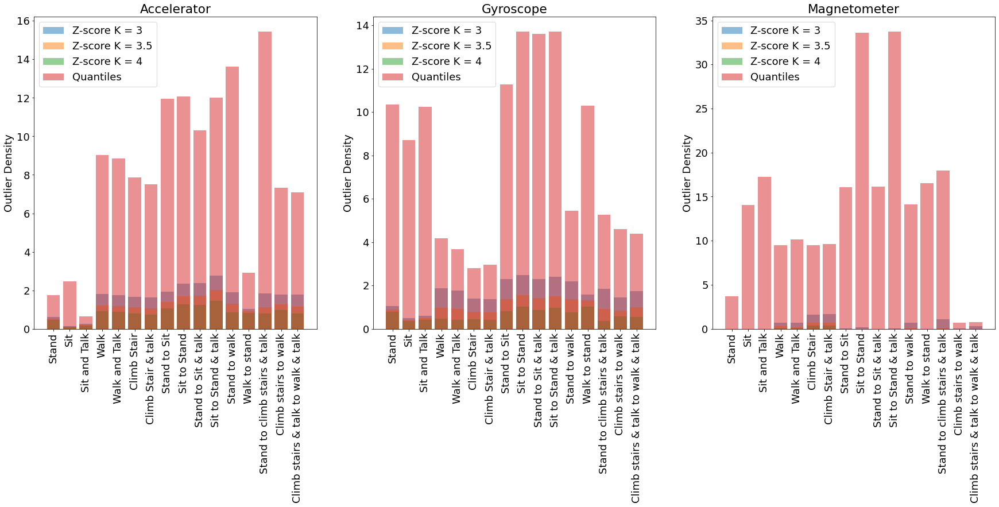

In [203]:
plot_outlier_densities_zscore_quantiles(accel_zscore, gyros_zscore, magnet_zscore, vars_quantil)

- Como podemos observar, as densidades de outliers calculadas a partir dos quartis são muito superiores às do Z-score para os 3 valores de k testados.

# Exercício 3.6

### Determinar número de clusters para o K-means

- Para decidir o número clusters a utilizar no K-means, utilizámos o Método do Cotovelo para cada atividade e cada sensor. Testámos para K = 1,2,...,9. Para obter este valor automaticamente, calculámos o ponto do gráfico que está a maior distância de uma linha reta que une os pontos para K=1 e K=9.

**Link do source** [Finding   k   in   k-means   clustering   automatically](https://www.youtube.com/watch?v=IEBsrUQ4eMc)

In [136]:
def calc_distance(x1, y1, a, b, c):
    return abs((a*x1 + b*y1 + c)) / ((a*a + b*b)**0.5)

def choose_best_k(data):
    
    best_ks = []
    for i in range(len(data)):
        distortions = []
        ks = [i for i in range(1,10)]
        for k in ks:
            distortions.append(KMeans(n_clusters=k).fit(data[i]).inertia_)
        
        a = distortions[0] - distortions[8]
        b = ks[8] - ks[0]
        c1 = ks[0] * distortions[8]
        c2 = ks[8] * distortions[0]
        c = c1 - c2
        
        dists_from_line = [calc_distance(ks[k], distortions[k], a, b, c) for k in range(9)]
        best_ks.append(dists_from_line.index(max(dists_from_line))+1)
        
    return best_ks

In [58]:
# Calcular os melhores números de clusters para cada atividade e cada sensor.

best_ks_accel = choose_best_k(acceleration)
best_ks_gyros = choose_best_k(gyroscope)
best_ks_magnet = choose_best_k(magnetometer)

In [59]:
print(best_ks_accel)
print(best_ks_gyros)
print(best_ks_magnet)

[4, 3, 3, 4, 4, 4, 4, 2, 4, 3, 4, 4, 4, 4, 4, 4]
[3, 2, 4, 3, 3, 3, 3, 3, 3, 2, 4, 3, 3, 4, 3, 3]
[3, 3, 3, 4, 3, 4, 4, 3, 3, 3, 4, 3, 4, 3, 3, 3]


### Computar clusters com K-means

In [156]:
# Determinar e Visualizar outliers com K-means.

def eucladian_dist_point_centroids(x, centroids):
    
    return ((x[0]-centroids[:,0])**2 + (x[1]-centroids[:,1])**2 + (x[2]-centroids[:,2])**2)**0.5

def update_centroids(clusters, centroids, n):
    
    for i in range(n):
        cluster = clusters[clusters[:,3] == i, 0:3]
        centroids[i,0] = np.mean(cluster[:,0])
        centroids[i,1] = np.mean(cluster[:,1])
        centroids[i,2] = np.mean(cluster[:,2])

def kmeans(n,t):
    
    centroids = []
    len_t = len(t)
    for i in range(n):
        centroids.append(t[random.randint(0,len_t-1)])
    centroids = np.array(centroids)
    
    clusters = []
    
    # 1st iteration
    for x in t:
        min_dist = np.argmin(eucladian_dist_point_centroids(x, centroids))
        clusters.append(np.append(x, min_dist))
        
    clusters = np.array(clusters)
    update_centroids(clusters, centroids, n)
    
    # 2nd+ iterations (after every datapoint is assigned to a cluster)
    assign = 1
    while assign == 1:
        assign = 0
        for point in clusters:
            min_dist = np.argmin(eucladian_dist_point_centroids(point[0:3], centroids))
            if min_dist != point[3]:
                point[3] = min_dist
                assign = 1
        update_centroids(clusters, centroids, n)

    return clusters

def kmeans_var(ks, var):
    
    var_clusters = []
    for i in range(len(var)):
        var_clusters.append(kmeans(ks[i], var[i]))
        
    return var_clusters

In [79]:
# Computar clusters com a nossa implementação do k-means

acceleration_kmeans = kmeans_var(best_ks_accel, acceleration)
gyroscope_kmeans = kmeans_var(best_ks_gyros, gyroscope)
magnetometer_kmeans = kmeans_var(best_ks_magnet, magnetometer)

In [84]:
%store acceleration_kmeans gyroscope_kmeans magnetometer_kmeans

Stored 'acceleration_kmeans' (list)
Stored 'gyroscope_kmeans' (list)
Stored 'magnetometer_kmeans' (list)


In [21]:
%store -r

# Exercício 3.7

### Plots 3D dos clusters

- Para determinar outliers, aplicámos um threshold que define o número mínimo de elementos que um cluster tem de ter para ser considerado um cluster. Caso contrário, todos os pontos nesse cluster são considerados outliers.
- Sendo assim, quanto maior o treshold, maior a probabilidade de todos os pontos de umcluster serem identificados como outliers.

- Escolher um valor correto para o threshold de outliers é uma tarefa muito específica para cada tipo de atividade e sensor, sendo que, para simplificar, iremos optar por 10%.

In [219]:
def plot_kmeans(var_clusters, sensor, threshold):
    "Calculate kmeans for every activity in one variable vector."
    
    num_subplots = len(var_clusters)
    
    for i in range(num_subplots):
        fig = plwt.figure(figsize=[15, 15])
        ax = fig.add_subplot(projection='3d')

        clusters = var_clusters[i]
        threshold_num = threshold * len(clusters)
        
        k = int(np.max(clusters[:,3])) + 1
        for j in range(k):
            cluster = clusters[clusters[:,3] == j, 0:3]
            
            if len(cluster) > threshold_num:
                label = "Cluster " + str(j)
            else:
                label = "Outliers"

            ax.scatter(cluster[:,0], cluster[:,1], cluster[:,2], label=label)

        ax.set_title(sensor + " - " + activity_labels[i])
        plt.legend()

    plt.show()

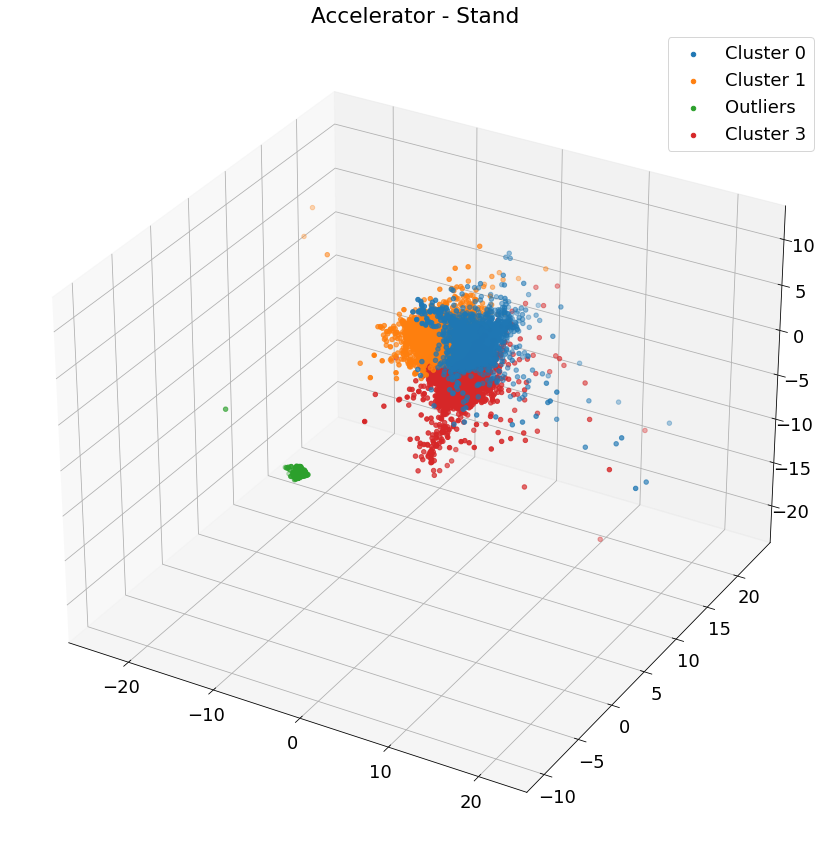

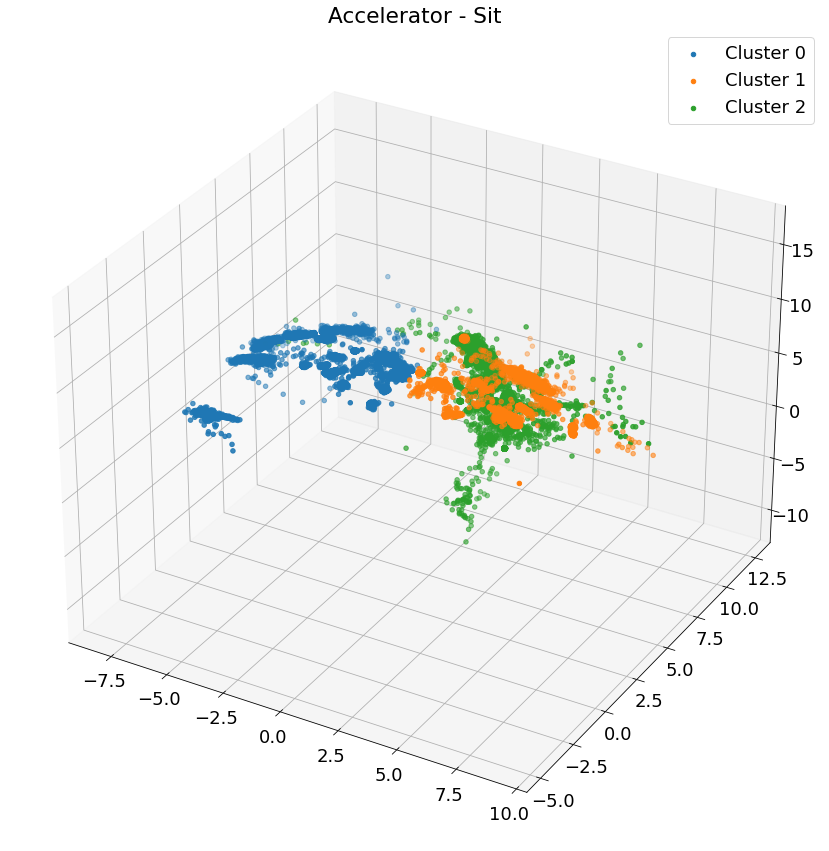

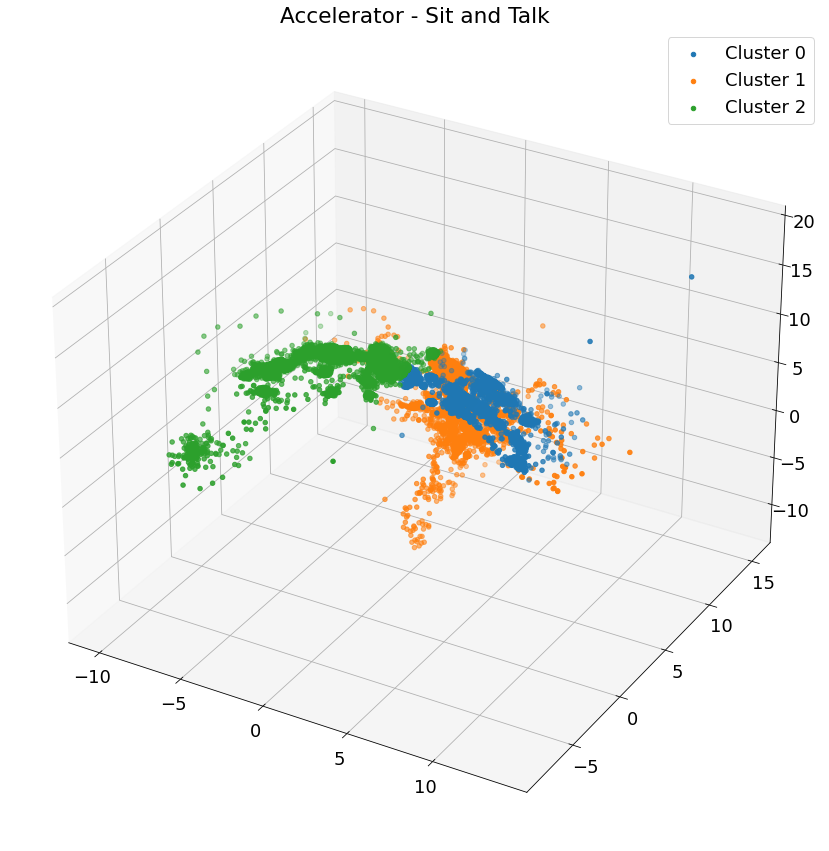

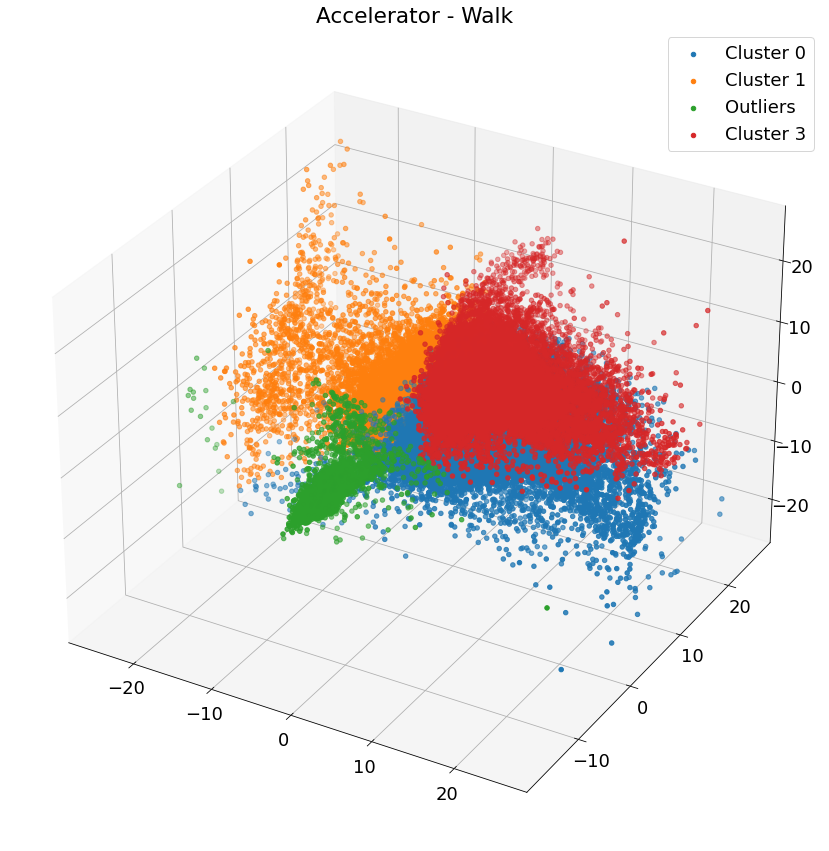

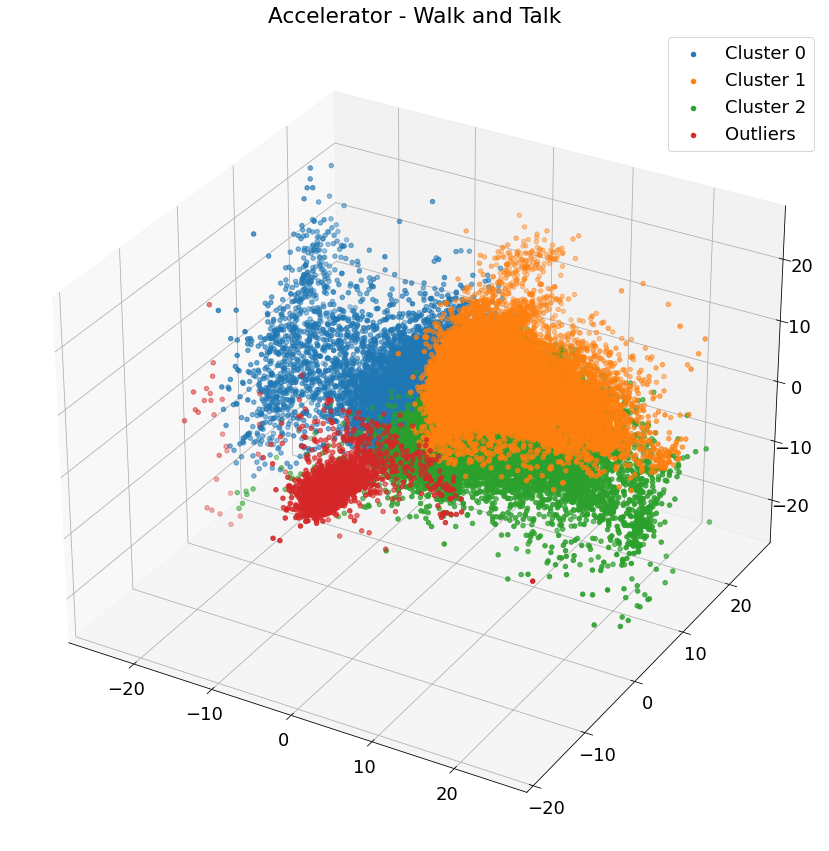

...

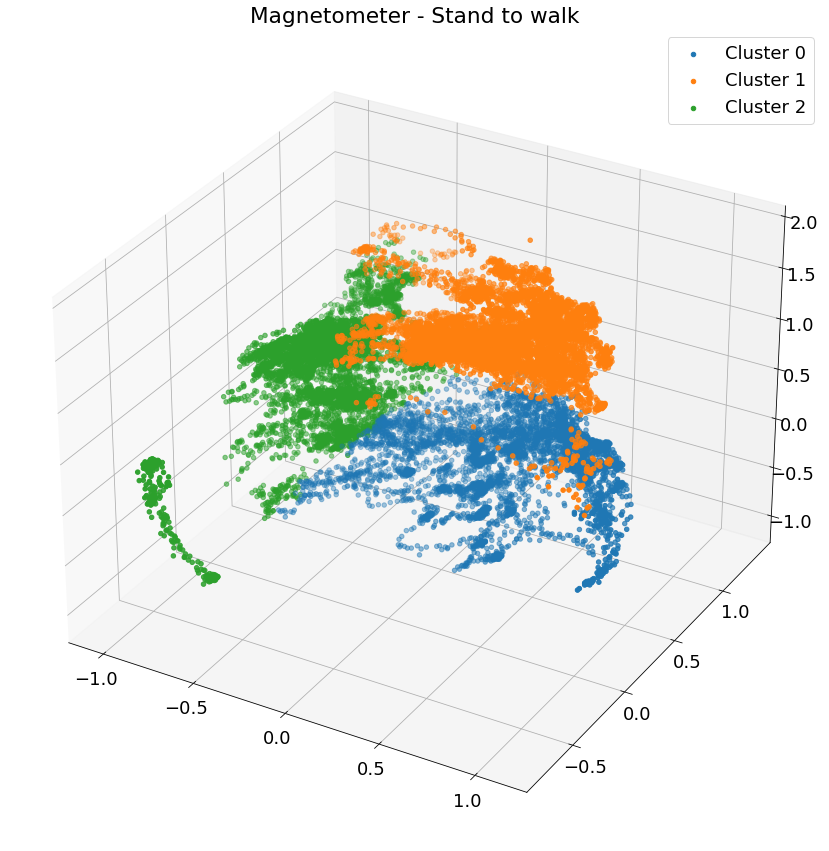

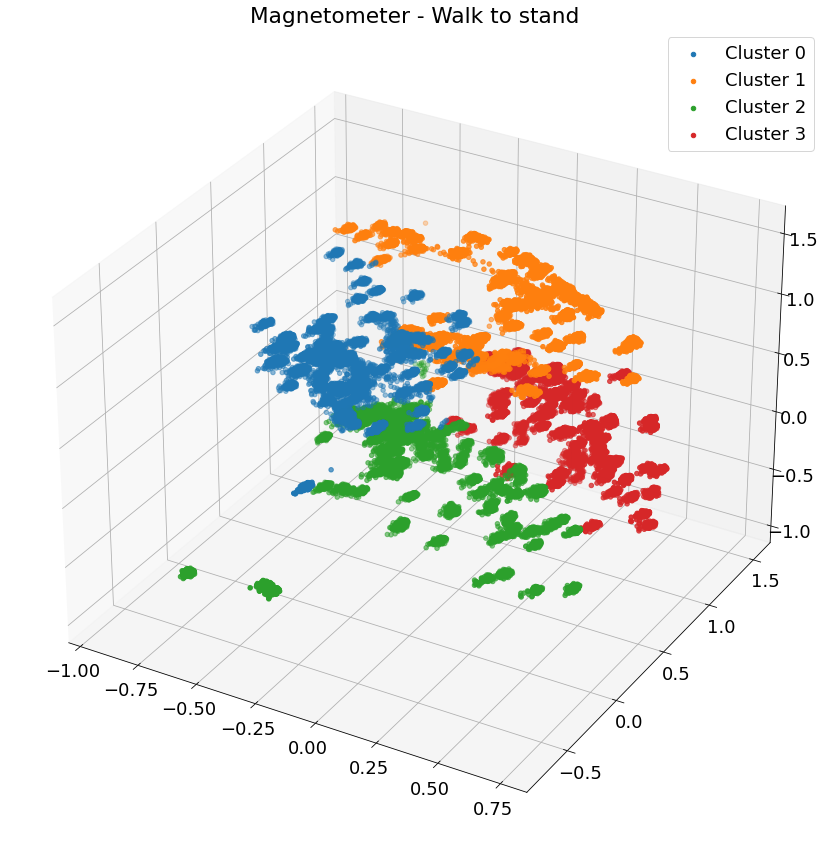

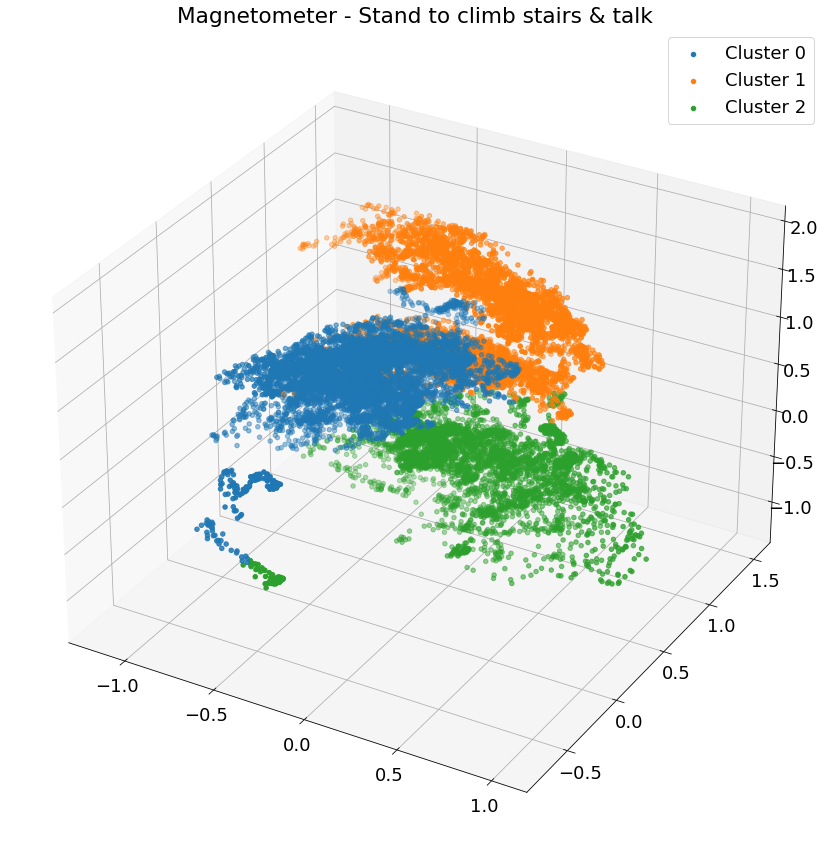

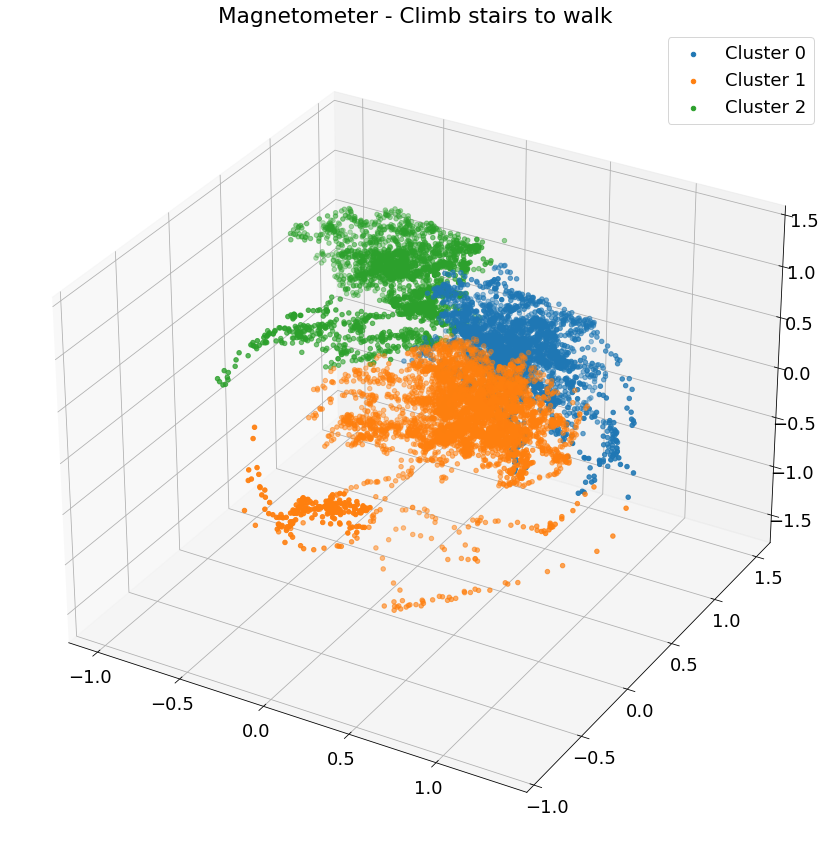

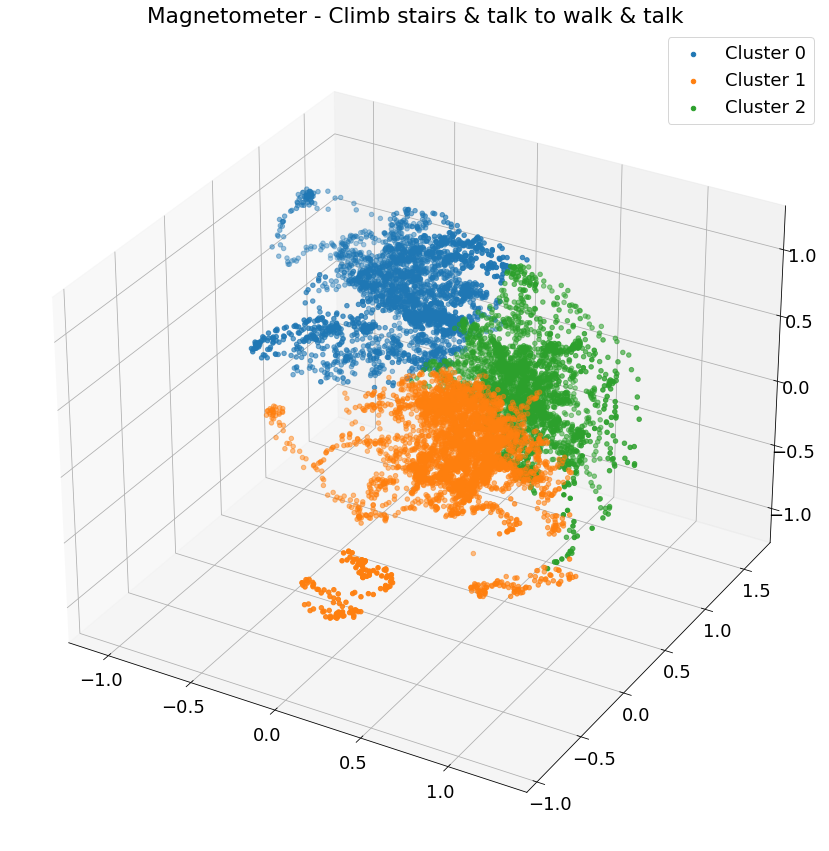

In [220]:
outlier_threshold = 1/10

plot_kmeans(acceleration_kmeans, "Accelerator", outlier_threshold)
plot_kmeans(gyroscope_kmeans, "Gyroscope", outlier_threshold)
plot_kmeans(magnetometer_kmeans, "Magnetometer", outlier_threshold)

## Comparação da Densidade de Outliers (K-means e Z-score)

In [24]:
def kmeans_outlier_density(var_clusters, threshold):
    outlier_densities = []
    
    for i in range(len(var_clusters)):
        clusters = var_clusters[i]
        threshold_num = threshold * len(clusters)
        
        num_outliers = 0
        k = int(np.max(clusters[:,3])) + 1
        for j in range(k):
            cluster = clusters[clusters[:,3] == j, 0:3]
            if len(cluster) <= threshold_num:
                num_outliers += len(cluster)
        
        outlier_density = (num_outliers / len(clusters)) * 100
        outlier_densities.append(outlier_density)
        
    return outlier_densities

In [25]:
accel_kmeans_out_dens = kmeans_outlier_density(acceleration_kmeans, outlier_threshold)
gyros_kmeans_out_dens = kmeans_outlier_density(gyroscope_kmeans, outlier_threshold)
magnet_kmeans_out_dens = kmeans_outlier_density(magnetometer_kmeans, outlier_threshold)

In [26]:
# Visualizar densidades de outliers obtidas com Z-score e K-means

def plot_outlier_densities_kmeans_zscore(kmeans_outlier_densities, zscore_outlier_densities, sensor, kmeans_outlier_threshold):
    "Compare outliers densities from kmeans and z-score."
    
    x = np.array([i for i in range(0,16)])
    
    plt.figure(figsize=[30, 10])
    plt.suptitle(f"{sensor} | K-means outlier threshold = {kmeans_outlier_threshold}")
    
    ax = plt.subplot(131)
    plt.title("Z-score k = 3")
    p_kmeans = plt.bar(x, kmeans_outlier_densities, label="K-means", alpha=0.5)
    p_zscore = plt.bar(x, zscore_outlier_densities[0], label="Z-score", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    
    ax = plt.subplot(132)
    plt.title("Z-score k = 3.5")
    p_kmeans = plt.bar(x, kmeans_outlier_densities, label="K-means", alpha=0.5)
    p_zscore = plt.bar(x, zscore_outlier_densities[1], label="Z-score", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    plt.legend()
    
    ax = plt.subplot(133)
    plt.title("Z-score k = 4")
    p_kmeans = plt.bar(x, kmeans_outlier_densities, label="K-means", alpha=0.5)
    p_zscore = plt.bar(x, zscore_outlier_densities[2], label="Z-score", alpha=0.5)
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(activity_labels)
    plt.ylabel("Outlier Density")
    
    
    plt.legend()
    plt.show()

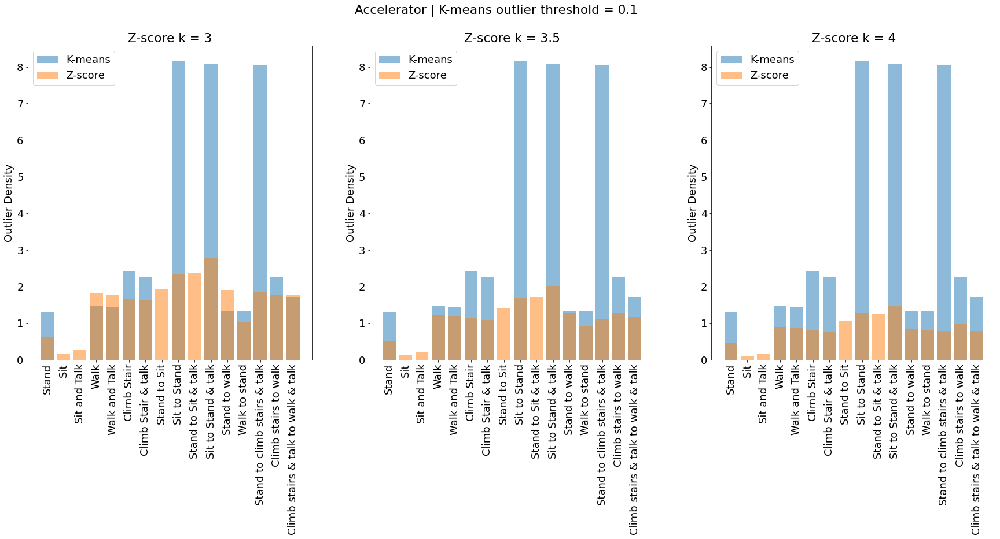

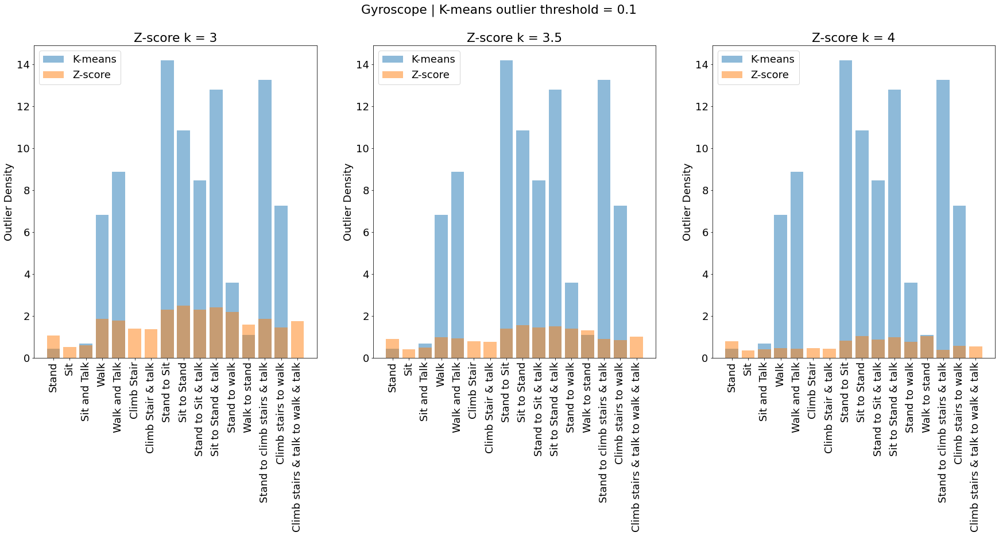

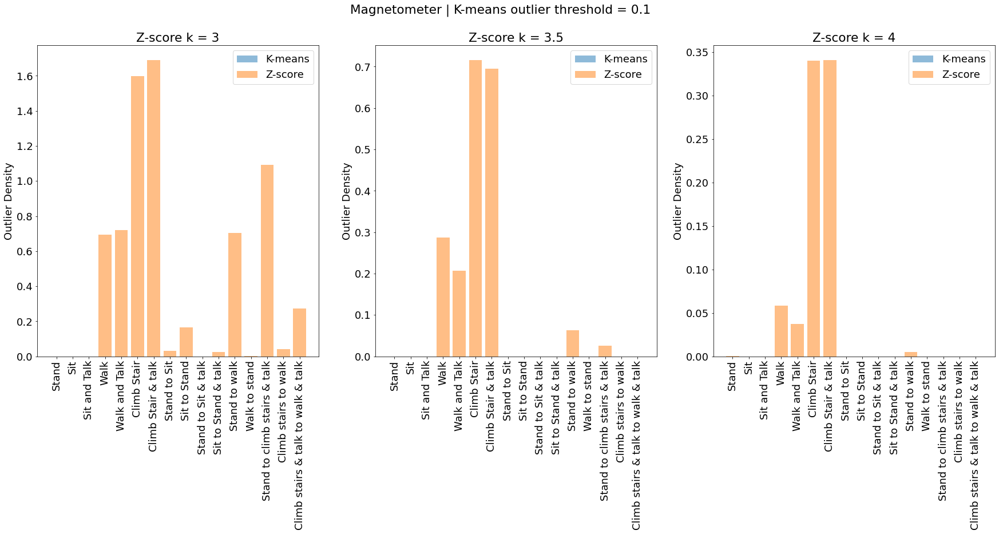

In [32]:
plot_outlier_densities_kmeans_zscore(accel_kmeans_out_dens, accel_zscore, "Accelerator", kmeans_outlier_threshold)
plot_outlier_densities_kmeans_zscore(gyros_kmeans_out_dens, gyros_zscore, "Gyroscope", kmeans_outlier_threshold)
plot_outlier_densities_kmeans_zscore(magnet_kmeans_out_dens, magnet_zscore, "Magnetometer", kmeans_outlier_threshold)

- A partir dos gráficos das densidades de outliers acima, não dá para retirar conclusões de comparação entre o K-means e o Z-score, uma vez que não há consistência, no que toca à densidade de outliers ser superior num em relação ao outro para os diferentes sensores e atividades.

# Exercícios 3.8 - 3.11

In [235]:
#injetar outliers

def calc_densidade_outliers(amostra,k):
    nr = len(amostra)
    media = amostra.mean()
    desvio = amostra.std()
    no = np.where(np.logical_or((media-k*desvio)>amostra,(media+k*desvio)<amostra))

    tam = len(no[0])
    d = (tam/nr)*100

    return d

def injetar_outliers(amostra,x,k):

    d = calc_densidade_outliers(amostra,k)

    if d < x: 
        #obter pontos nao outliers
        array_s = [-1,1]
        media = amostra.mean()
        desvio = amostra.std()
        limite = 4
        #indices da amostra
        outliers,nao_outliers = outliers_zscore(amostra,k)
        nao_outliers = nao_outliers[0]
        outliers = outliers[0]
        # numero de pontos a escolher nao outliers
        n_pontos = int(((x-d) /100) * len(nao_outliers))
        convert_outliers = list()
        out_inje = list()
        for i in range(n_pontos):
            ind_out= random.randint(0,len(nao_outliers)-1)
            while nao_outliers[ind_out] in out_inje:
                ind_out= random.randint(0,len(nao_outliers)-1)
            
            convert_outliers.append(amostra[nao_outliers[ind_out]])
            ind_s = random.randint(0,1)
            s = array_s[ind_s]
            q = random.random() * limite
            convert_outliers[i] = media + s*k*(desvio+q)
            out_inje.append(nao_outliers[ind_out])             
            amostra[nao_outliers[ind_out]] = convert_outliers[i]
        return amostra,out_inje,outliers

- Calculo do beta para o modulo linear

In [236]:
#3.9 
#considerar que a amostra ja vem com i tamanho n
def calculo_beta(amostra,p):
    #considerar que a amostra ja vem com o n definido
    y = amostra[p:]
    x = np.ones((len(y),p+1))
    cont = p-1
    for i in range(len(y)):
        x[i,1:] = amostra[(cont-p)+1:cont+1][::-1] 
        cont+=1

    new_x = np.linalg.pinv(x)
    
    beta = np.dot(new_x,y)
    return beta,x,y

In [237]:
array = np.array([10.0255,10.043,11,12,13])
calculo_beta([10.0255,10.043,11,12,13],2)
calculo_beta(array,1)

(array([-2.34508684,  1.28686505]),
 array([[ 1.    , 10.0255],
        [ 1.    , 10.043 ],
        [ 1.    , 11.    ],
        [ 1.    , 12.    ]]),
 array([10.043, 11.   , 12.   , 13.   ]))

In [238]:
def modelo_linear(valor_real,p):
    x = np.arange(len(valor_real))
    plt.scatter(x,valor_real,label = 'valor real')
    beta,x,y = calculo_beta(valor_real,p)
    t = np.arange(p,len(valor_real))
    y = sum([beta[i] * x[t-p,i] for i in range(0,p+1)])

    plt.scatter(t,y,color='red',label = 'valor previsto')
    plt.title("Valores previstos segundo o modelo linear")

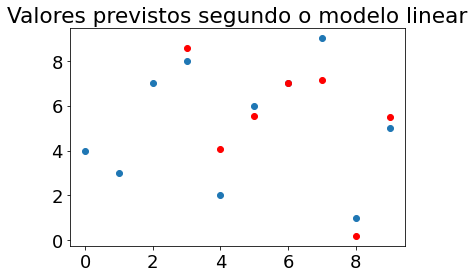

In [239]:
array =np.array([4,3,7,8,2,6,7,9,1,5])
modelo_linear(array,3)

In [240]:
def modelo_outliers(mod_acc,k,x_per):
    amostra_inicial = mod_acc.copy()
    amostra_injetada,ind_inje,outliers_existentes = injetar_outliers(mod_acc,x_per,k)
    ind_inje_np = np.array(ind_inje)
    #indices injetados
    outliers = np.concatenate((ind_inje_np,outliers_existentes),axis = None)
    outliers = np.sort(outliers)
    outliers_list =outliers.tolist()
    ind_inje_np = np.sort(ind_inje_np)
    return ind_inje_np,amostra_injetada,amostra_inicial,outliers,outliers_existentes

In [241]:
acc_stand = m_acceleration[0].copy()
k = 4
x_per = 10
ind_inje_np,amostra_injetada,amostra_inicial,outliers_total,outliers_existentes = modelo_outliers(acc_stand,k,x_per)

- Nesta função, apresentamos gráficos relativos aos outliers e não outliers da amostra. Escolhemos uma janela que tenha sido injetada com x outliers, e mostramos a amostra inicial, distinguindo os outliers preexistentes (vermelho) e não outlieres (azuis).
- De seguida, mostramos a amostra com os x outliers injetados (vermelho)

In [242]:
def plot_amostras(cont,inicio,window):
    amostra_ind_out = ind_inje_np[inicio:inicio+window]
    amostra_ini_janela = amostra_inicial[amostra_ind_out[0]:amostra_ind_out[len(amostra_ind_out)-1]+1]

    x_n_outliers = np.arange(amostra_ind_out[0],amostra_ind_out[len(amostra_ind_out)-1]+1)
    y_n_outliers = amostra_ini_janela
    x_n_outliers_inje = x_n_outliers.copy()
    y_n_outliers_inje = y_n_outliers.copy()
    result = outliers_existentes[np.where((outliers_existentes>=amostra_ind_out[0]) & (outliers_existentes<amostra_ind_out[len(amostra_ind_out)-1]))]
    plt.figure(cont)
    if len(result)!=0:
        y_outliers = amostra_inicial[result]
        x_outliers = result
        plt.scatter(x_outliers,y_outliers,color='red')
    lista_indices_remover=[]
    lista_valores_remover=[]
    for i in result:
        indices_outliers = np.where(x_n_outliers == i)
        lista_valores_remover.append(x_n_outliers[indices_outliers[0]])
        lista_indices_remover.append(indices_outliers[0])
    x_n_outliers = np.delete(x_n_outliers,lista_indices_remover)    
    y_n_outliers = np.delete(y_n_outliers,lista_indices_remover)
    plt.scatter(x_n_outliers,y_n_outliers,color='blue')
    plt.title("Amostra inicial")

    plt.figure(cont+1)
    result = amostra_ind_out
    if len(result)!=0:
        y_outliers = amostra_injetada[result]
        x_outliers = result
        plt.scatter(x_outliers,y_outliers,color='red')
    lista_indices_remover=[]
    lista_valores_remover=[]
    for i in amostra_ind_out:
        indices_outliers = np.where(x_n_outliers_inje == i)
        lista_valores_remover.append(x_n_outliers_inje[indices_outliers])
        lista_indices_remover.append(indices_outliers[0])
    x_n_outliers_inje = np.delete(x_n_outliers_inje,lista_indices_remover)    
    y_n_outliers_inje = np.delete(y_n_outliers_inje,lista_indices_remover)
    x_outliers = np.array(lista_valores_remover)
    plt.scatter(x_n_outliers_inje,y_n_outliers_inje,color='blue')
    plt.title("Amostra injetada com outliers")

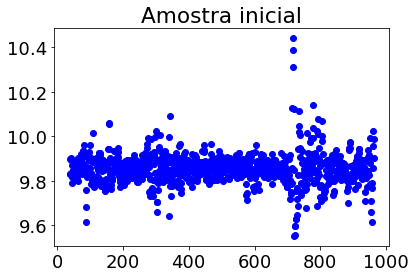

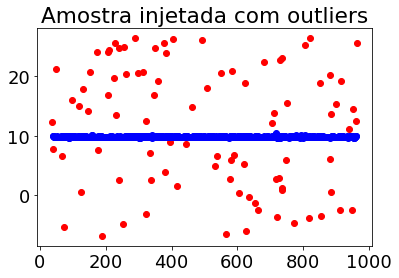

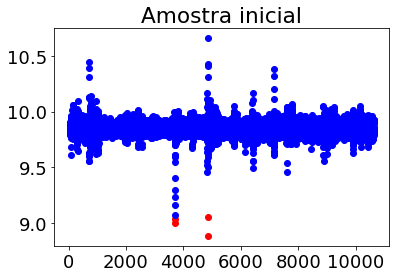

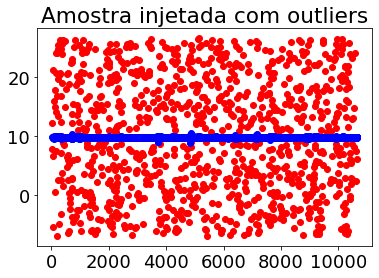

In [243]:
inicio = 5
window = 90
plot_amostras(0,inicio,window)
inicio = 5
window = 1000
plot_amostras(2,inicio,window)

- Esta função tem a finalidade de escolher indices para posteriormente serem utilizados para a previsão de valores com o modelo linear

In [250]:
def choose_amostra(var,valor_real,p,amostra_ind_out,posicao_outlier):
    #mandar o indice dos outliers
    amostra_teste = []
    amostra_teste.append(posicao_outlier)
    if var ==0:
        cont = posicao_outlier-1
    else:
        cont = posicao_outlier+1
    while len(amostra_teste)<p+1:
        if cont not in amostra_ind_out:
            amostra_teste.append(cont)
        if var ==0:
            cont = cont-1
        else:
            cont = cont+1

    amostra_teste = amostra_teste[::-1]

    valor_acc_real = valor_real[amostra_teste]
    return valor_acc_real,amostra_teste

In [251]:
total_out= np.array([1,2,6,8,10,12,20,23])
valor_real = np.array([1.3,1.4,1.5,1.6,1.7,1.7,1.8,2.9,1.3,1.4,1.5,1.6,1.7,1.7,1.8,2.9,3.4,7.8,9.8,5.8,5.7,1.2,1.8,1.7,1.9])
choose_amostra(0,valor_real,2,total_out,10)

(array([2.9, 1.4, 1.5]), [7, 9, 10])

In [327]:
def plot_distribuicao_p_3_10(k,p_min,amostra_inicial,amostra_injetada,inicio,window,outliers_total,p_max):
    #todos os indices injetados
    amostra_ind_out = ind_inje_np[inicio:inicio+window]
    print(amostra_inicial.tolist())
    amostra_janela = amostra_inicial[:]
    out,n_out = outliers_zscore(amostra_janela,k)
    out=out[0]
    n_out=n_out[0]

    total_p_erro = []
    valor_lista_real=[]
    valor_lista_previsto=[]
    #print(outliers_total_list)
    erro_cada_p=np.ones(p_max-p_min+1)
    for i in range(p_min,p_max+1):
        previsto = []
        erro = []
        erro_distri=[]

        amostra_treino = amostra_janela[n_out]
        #print(amostra_treino)
        beta,_,_ = calculo_beta(amostra_treino,i)

        for j in range(len(amostra_ind_out)):
            valor_acc_real,amostra_teste = choose_amostra(0,amostra_inicial,i,amostra_ind_out,amostra_ind_out[j])
            valor_acc_real = valor_acc_real.tolist()
            valor_real = amostra_inicial[amostra_teste[i]]
            if (len(valor_lista_real)!=window):
                valor_lista_real.append(valor_real)
            _,x,_=calculo_beta(valor_acc_real,i)

            valor_previsto = x.dot(beta)
            previsto.append(valor_previsto)
            erro_distri.append(abs(valor_previsto-valor_real)**2)
            erro.append(abs(valor_previsto-valor_real)**2)
        erro_numpy = np.array(erro)
        erro_cada_p[i-p_min] = erro_numpy.sum()
        total_p_erro.append(erro_distri)
        valor_lista_previsto.append(previsto)
    print(erro_cada_p)
    plt.figure()
    x = np.arange(p_min,p_max+1)
    plt.bar(x,erro_cada_p)
    title = "Variacao do erro quadrado em relacao ao p"
    plt.title(title)
    plt.xlabel("p valores")
    
    plt.ylabel("Somatorio erro quadrado")

    return total_p_erro,erro_cada_p,valor_lista_real,valor_lista_previsto

In [334]:
def calcula_beta_3_11(amostra,p):
    amostra1 = np.copy(amostra)
    if p%2 ==0:
        p_ant = p//2
        p_seg = p//2
    else:
        p_ant= p//2+1
        p_seg =p//2
    cont =0
    y=[]

    while cont+1+p_ant+p_seg<=len(amostra):
        y.append(amostra1[cont+p_ant])
        cont+=1
    y = np.array(y)
    
    amostra2 = np.copy(amostra1)
    x = np.ones((len(y),p+1))
    for i in range(len(y)):
        #first
        test = np.copy(amostra1[i:i+p_ant+p_seg+1])
        test[p_ant] = 1
        x[i,:] = test
    x = np.array(x)
    
    new_x = np.linalg.pinv(x)
    
    beta = np.dot(new_x,y)
    return beta,x,y

In [335]:
calcula_beta_3_11([1,2,3,4,5,6,7,8],3)

(array([0.17647059, 0.29411765, 0.11764706, 0.52941176]),
 array([[1., 2., 1., 4.],
        [2., 3., 1., 5.],
        [3., 4., 1., 6.],
        [4., 5., 1., 7.],
        [5., 6., 1., 8.]]),
 array([3, 4, 5, 6, 7]))

In [336]:
def plot_distribuicao_p_3_11(p_min,amostra_inicial,amostra_injetada,inicio,window,outliers_total,p_max):
    amostra_ind_out = ind_inje_np[inicio:inicio+window]

    amostra_janela = amostra_inicial.copy()
    out,n_out = outliers_zscore(amostra_janela,k)
    amostra_treino = amostra_janela[n_out]
    
    total_p_erro = []
    valor_lista_real=[]
    valor_lista_previsto=[]
    erro_cada_p=np.ones(p_max-p_min+1)
    
    for i in range(p_min,p_max+1):
        previsto = []
        erro = []
        erro_distri=[]
        beta,x,y = calcula_beta_3_11(amostra_treino,i)
        
        for j in range(len(amostra_ind_out)):
            if i%2 ==0:
                p_ant = i//2
                p_seg = i//2
            else:
                p_ant= i//2+1
                p_seg =i//2
            #arranjar amostra

            valor_acc_real1,amostra_teste1 = choose_amostra(0,amostra_inicial,p_ant,amostra_ind_out,amostra_ind_out[j])
            valor_acc_real2,amostra_teste2 = choose_amostra(1,amostra_inicial,p_seg,amostra_ind_out,amostra_ind_out[j])
            amostra_juncao = amostra_teste1 + amostra_teste2[::-1][1:]
            valor_acc_real = amostra_inicial[amostra_juncao]
            valor_real = amostra_inicial[amostra_teste1[len(amostra_teste1)-1]]
            if (len(valor_lista_real)!=window):
                valor_lista_real.append(valor_real)
            
            _,x1,_=calcula_beta_3_11(valor_acc_real.tolist(),i)
            valor_previsto = x1.dot(beta)
            previsto.append(valor_previsto)
            erro_distri.append(abs(valor_previsto-valor_real)**2)
            erro.append(abs(valor_previsto-valor_real)**2)
        erro_numpy = np.array(erro)
        erro_cada_p[i-p_min] = erro_numpy.sum()
        total_p_erro.append(erro_distri)
        valor_lista_previsto.append(previsto)
    plt.figure()
    
    x = np.arange(p_min,p_max+1)
    plt.bar(x,erro_cada_p)
    title = "Variacao do erro quadrado em relacao ao p"
    plt.title(title)
    plt.xlabel("p valores")
    
    plt.ylabel("Somatorio erro quadrado")
    return total_p_erro,erro_cada_p,valor_lista_real,valor_lista_previsto

In [337]:
def apresentar_erro_distribuicao(p_min,inicio,window,p_max,erro_total,erro_p,valor_real,valor_previsto):
    amostra_ind_out = ind_inje_np[inicio:inicio+window]
    
    indice = np.where(erro_p == np.amin(erro_p))
    indice = indice[0][0]
    
    print("Menor p ",str(indice+p_min))
    print(erro_p[indice])

    #display da distribuicao do erro
    plt.figure()
    
    plt.plot(erro_total[indice],color = "blue")
    plt.title("Display da distribuicao do erro quadratico para o melhor p "+str(indice+p_min))
    plt.figure()
    
    x = np.arange(0,len(valor_real))
    
    plt.scatter(x,valor_real,color="blue",label ="real")
    plt.title("Previsão de "+str(window)+" outliers")
    plt.scatter(x,valor_previsto[indice],color="red",label = "Previsao")
    plt.title(str(window)+" outliers")

- Escolhemos um p_min e um p_max, treinamos o modelo linear e obtemos o melhor p.
- Apresentamos a distribuição do erro na previsão dos valores utilizando o melhor p.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1.16280016 0.8855583  0.78524367 0.76277874 0.74609598 0.77200439
 0.77533179 0.77350535 0.74318386 0.71944422 0.70745073 0.69768431
 0.68931001 0.68687217 0.68999517 0.687301   0.67256873 0.67037851
 0.66615274]
Menor p  20
0.6661527431977398
Menor p  5
0.19664403224617616


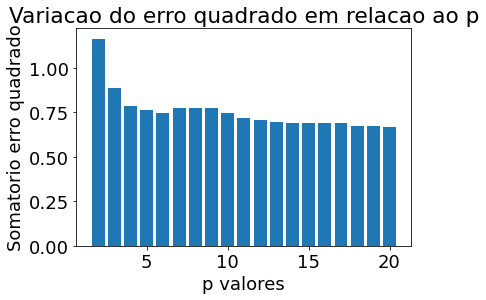

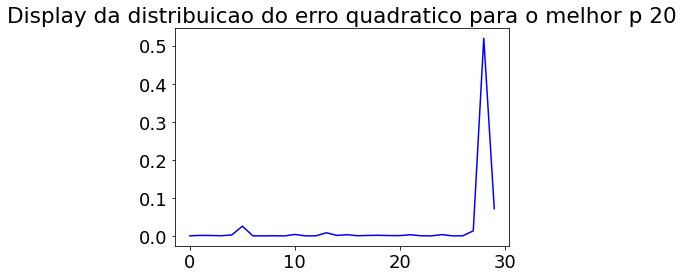

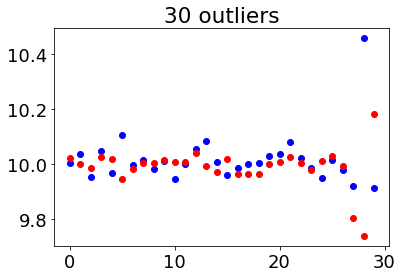

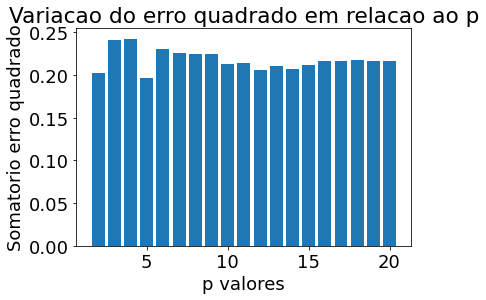

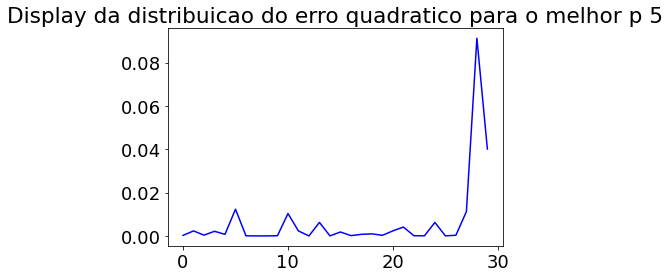

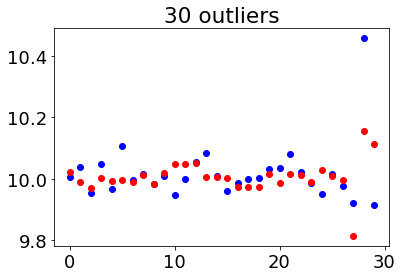

In [338]:
inicio = 1510
window = 30
p_max = 20
p_min = 2

erro_total,erro_p,valor_real,valor_previsto=plot_distribuicao_p_3_10(k,p_min,amostra_inicial,amostra_injetada,inicio,window,outliers_total,p_max)
apresentar_erro_distribuicao(p_min,inicio,window,p_max,erro_total,erro_p,valor_real,valor_previsto)


erro_total,erro_p,valor_real,valor_previsto=plot_distribuicao_p_3_11(p_min,amostra_inicial,amostra_injetada,1510,30,outliers_total,p_max)
apresentar_erro_distribuicao(p_min,inicio,window,p_max,erro_total,erro_p,valor_real,valor_previsto)

## Comparação do 3.10 com 3.11

- Em ambos os exercícios, o modelo foi testado da mesma da mesma forma com a mesma amostra de treino, o modelo da acelaração da atividade stand.
- No entanto, ao analisarmos os gráficos, verificamos que o modelo 3.11 obtem valores erros mais pequenos, e consequentemente, tem valores previstos mais próximos do real.

# Exercício 4.1

## Kolmogorov-Smirnov (aferir gaussanidade)

In [37]:
# https://stackoverflow.com/questions/46678239/p-value-is-0-when-i-use-scipy-stats-kstest-for-large-dataset

def normality_test(var, sensor):
    "Kolmogorov-Smirnov test for knowing the gaussianity of the distribution of var."

    for i in range(len(var)):
        activity_data = var[i]
        
        # Obtain normal distribution
        loc, scale = stats.norm.fit(activity_data)
        n = stats.norm(loc=loc, scale=scale)

        
        x = np.arange(activity_data.min(), activity_data.max(), 0.05)
        
        print(f"\n----- {activity_labels[i]} -----")
        plt.hist(activity_data, bins=x, density=True)
        plt.plot(x, n.pdf(x))
        plt.show()

        print(stats.kstest(activity_data, n.cdf))


----- Stand -----


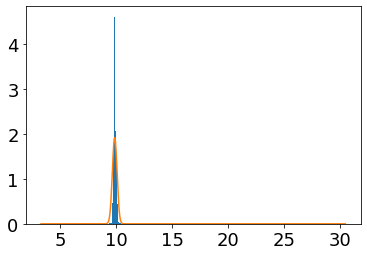

KstestResult(statistic=0.1617660451373944, pvalue=0.0)

----- Sit -----


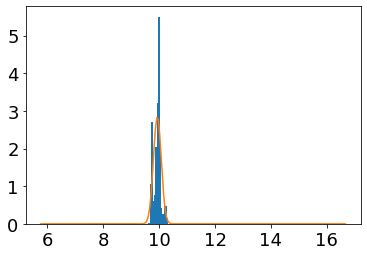

KstestResult(statistic=0.10540706154056811, pvalue=0.0)

----- Sit and Talk -----


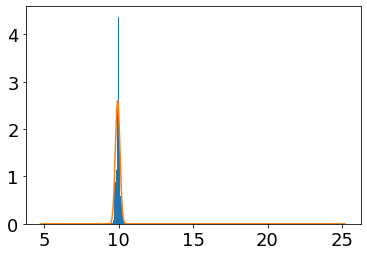

KstestResult(statistic=0.09123740666545377, pvalue=0.0)

----- Walk -----


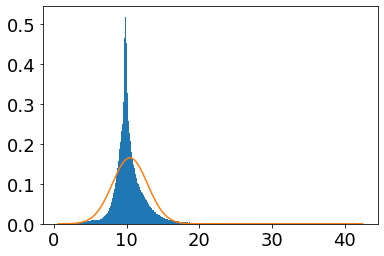

KstestResult(statistic=0.13843600385128907, pvalue=0.0)

----- Walk and Talk -----


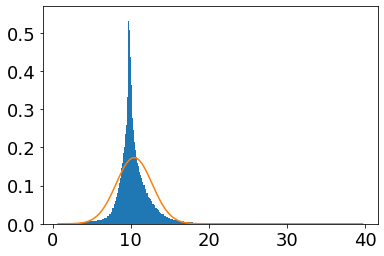

KstestResult(statistic=0.1351502527195536, pvalue=0.0)

----- Climb Stair -----


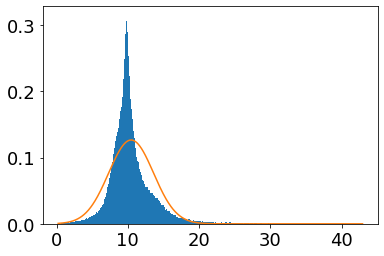

KstestResult(statistic=0.1341477998059627, pvalue=0.0)

----- Climb Stair & talk -----


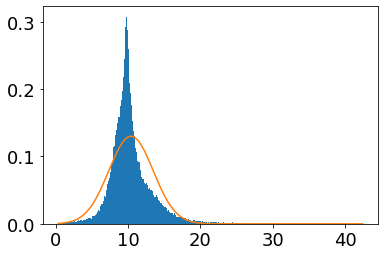

KstestResult(statistic=0.13221843757945728, pvalue=0.0)

----- Stand to Sit -----


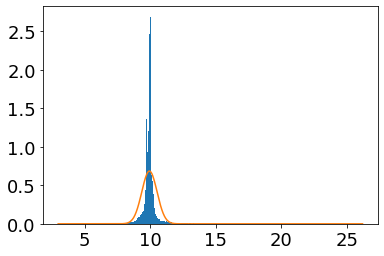

KstestResult(statistic=0.20913254519483349, pvalue=0.0)

----- Sit to Stand -----


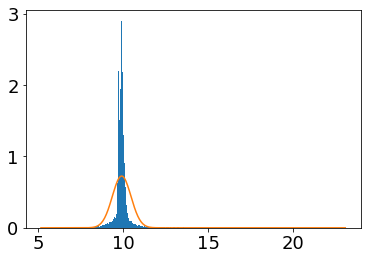

KstestResult(statistic=0.22746030015168944, pvalue=0.0)

----- Stand to Sit & talk -----


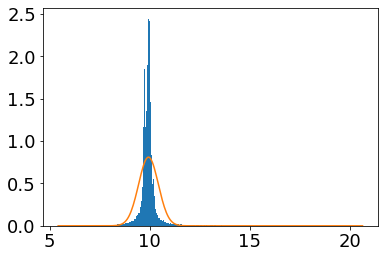

KstestResult(statistic=0.19938151941656057, pvalue=0.0)

----- Sit to Stand & talk -----


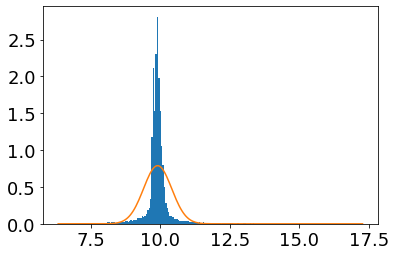

KstestResult(statistic=0.21790122581095733, pvalue=0.0)

----- Stand to walk -----


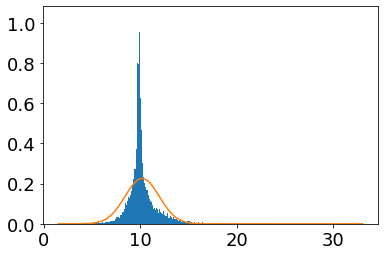

KstestResult(statistic=0.1691419555369672, pvalue=0.0)

----- Walk to stand -----


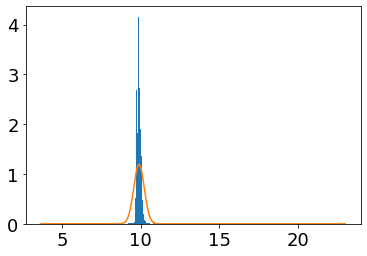

KstestResult(statistic=0.25153069052548094, pvalue=0.0)

----- Stand to climb stairs & talk -----


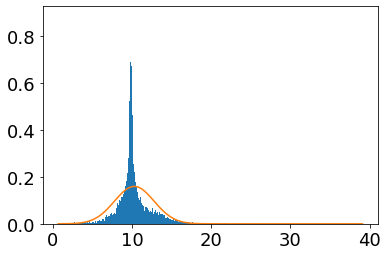

KstestResult(statistic=0.17286486409386348, pvalue=0.0)

----- Climb stairs to walk -----


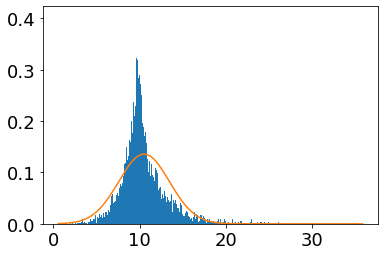

KstestResult(statistic=0.13448325340086575, pvalue=1.0694954051816471e-150)

----- Climb stairs & talk to walk & talk -----


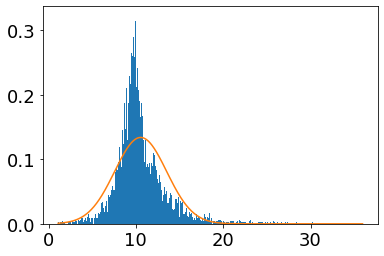

KstestResult(statistic=0.12724220576810696, pvalue=6.781576314660558e-135)


In [38]:
normality_test(m_acceleration, "Acceleration")


----- Stand -----


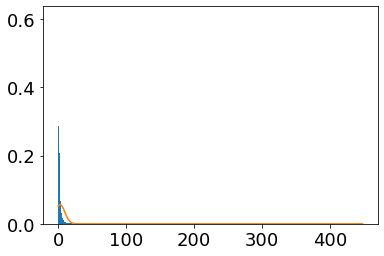

KstestResult(statistic=0.35094835212896436, pvalue=0.0)

----- Sit -----


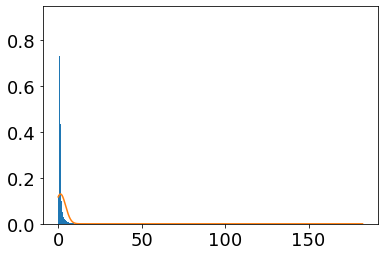

KstestResult(statistic=0.33942520722203373, pvalue=0.0)

----- Sit and Talk -----


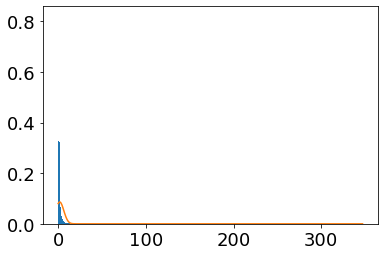

KstestResult(statistic=0.3581754058013694, pvalue=0.0)

----- Walk -----


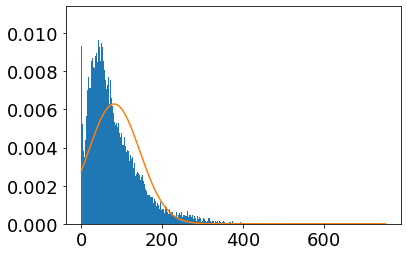

KstestResult(statistic=0.10963487977761371, pvalue=0.0)

----- Walk and Talk -----


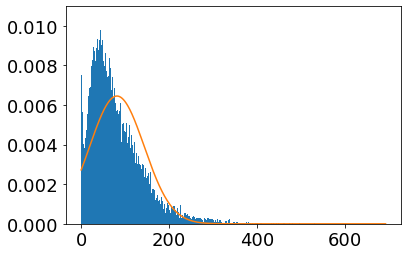

KstestResult(statistic=0.10573501308823835, pvalue=0.0)

----- Climb Stair -----


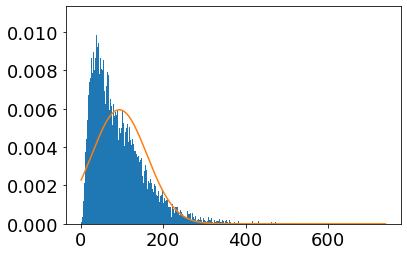

KstestResult(statistic=0.09629999567514046, pvalue=0.0)

----- Climb Stair & talk -----


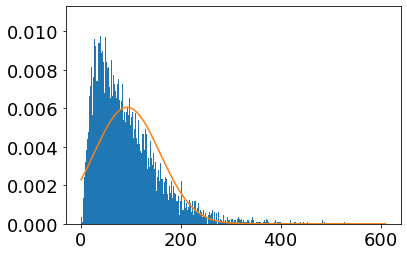

KstestResult(statistic=0.09379626819982247, pvalue=0.0)

----- Stand to Sit -----


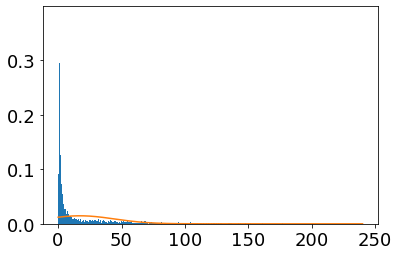

KstestResult(statistic=0.2649406527006409, pvalue=0.0)

----- Sit to Stand -----


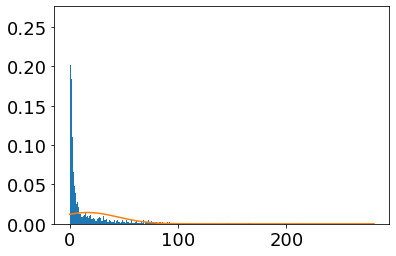

KstestResult(statistic=0.2777478983934764, pvalue=0.0)

----- Stand to Sit & talk -----


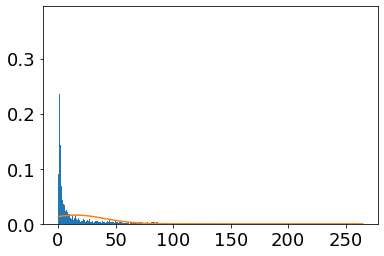

KstestResult(statistic=0.2749489872398455, pvalue=0.0)

----- Sit to Stand & talk -----


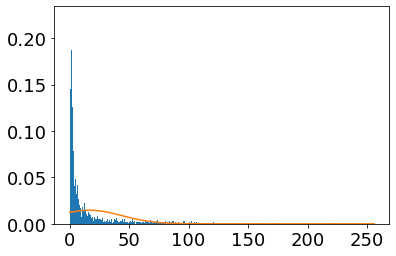

KstestResult(statistic=0.2741058233569437, pvalue=0.0)

----- Stand to walk -----


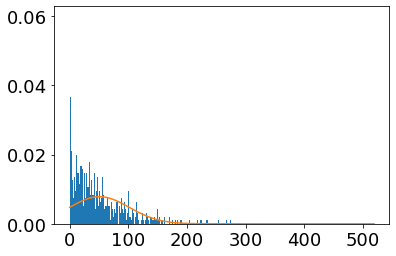

KstestResult(statistic=0.1594296389448962, pvalue=0.0)

----- Walk to stand -----


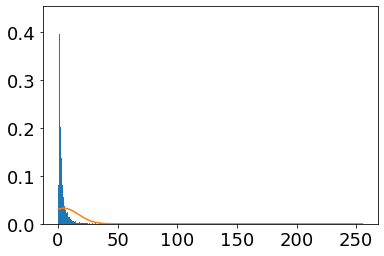

KstestResult(statistic=0.35455846586850903, pvalue=0.0)

----- Stand to climb stairs & talk -----


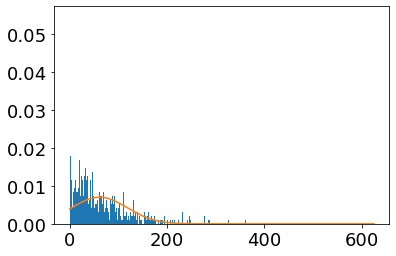

KstestResult(statistic=0.14131303741777732, pvalue=0.0)

----- Climb stairs to walk -----


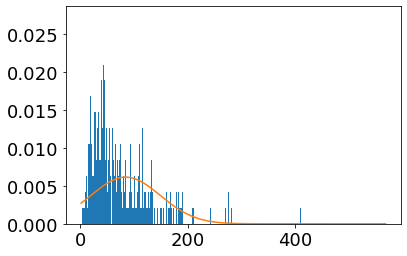

KstestResult(statistic=0.125848065077646, pvalue=5.914274100478343e-132)

----- Climb stairs & talk to walk & talk -----


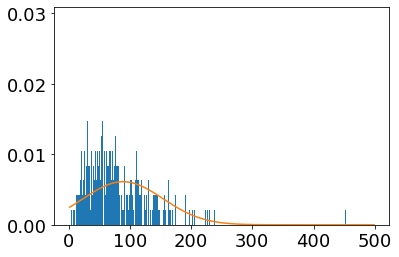

KstestResult(statistic=0.11951485151287172, pvalue=5.209017949890237e-119)


In [39]:
normality_test(m_gyroscope, "Gyroscope")


----- Stand -----


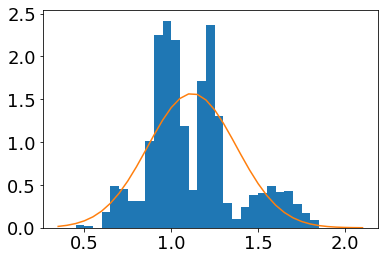

KstestResult(statistic=0.09349670116152753, pvalue=0.0)

----- Sit -----


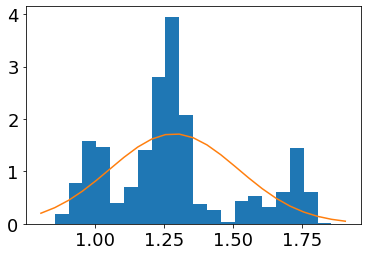

KstestResult(statistic=0.16123943618253456, pvalue=0.0)

----- Sit and Talk -----


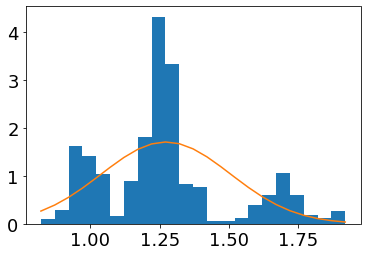

KstestResult(statistic=0.165982023230262, pvalue=0.0)

----- Walk -----


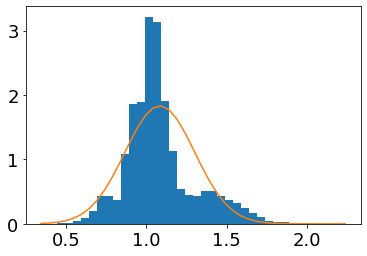

KstestResult(statistic=0.1302781510239136, pvalue=0.0)

----- Walk and Talk -----


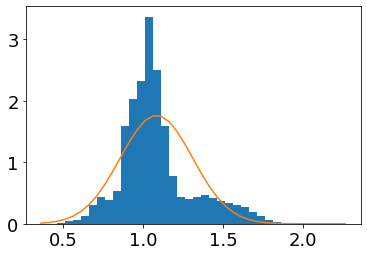

KstestResult(statistic=0.13721719160463797, pvalue=0.0)

----- Climb Stair -----


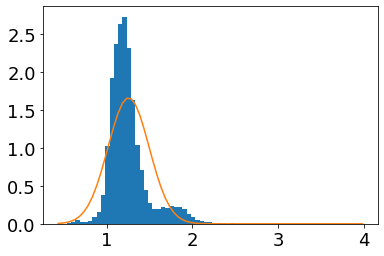

KstestResult(statistic=0.14663456072282421, pvalue=0.0)

----- Climb Stair & talk -----


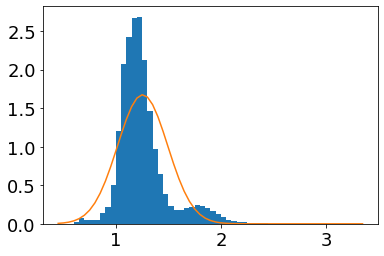

KstestResult(statistic=0.14093425526081504, pvalue=0.0)

----- Stand to Sit -----


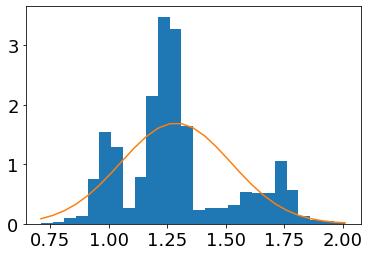

KstestResult(statistic=0.16283205602913586, pvalue=0.0)

----- Sit to Stand -----


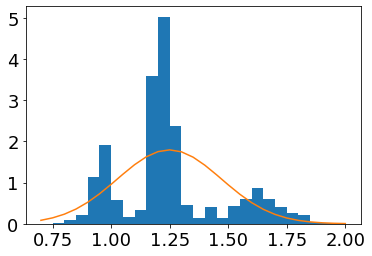

KstestResult(statistic=0.19129956127868808, pvalue=0.0)

----- Stand to Sit & talk -----


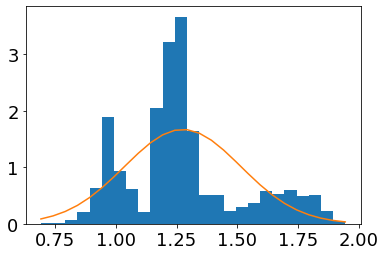

KstestResult(statistic=0.16644008093016927, pvalue=0.0)

----- Sit to Stand & talk -----


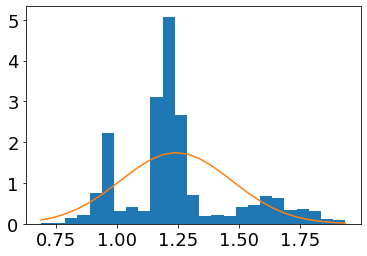

KstestResult(statistic=0.18850329345526695, pvalue=0.0)

----- Stand to walk -----


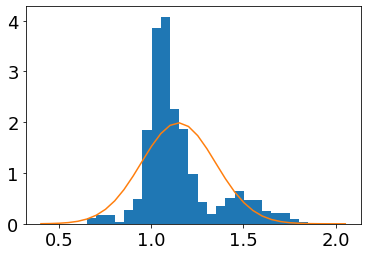

KstestResult(statistic=0.15563280661734763, pvalue=0.0)

----- Walk to stand -----


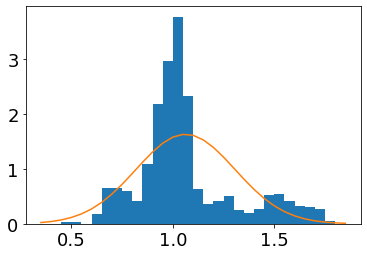

KstestResult(statistic=0.18956036976922608, pvalue=0.0)

----- Stand to climb stairs & talk -----


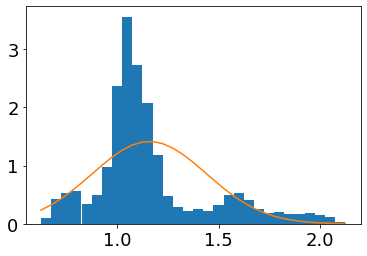

KstestResult(statistic=0.1880328866528812, pvalue=0.0)

----- Climb stairs to walk -----


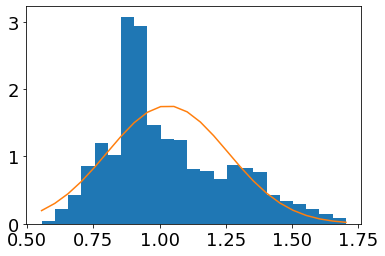

KstestResult(statistic=0.12291029380843127, pvalue=7.257959388870688e-126)

----- Climb stairs & talk to walk & talk -----


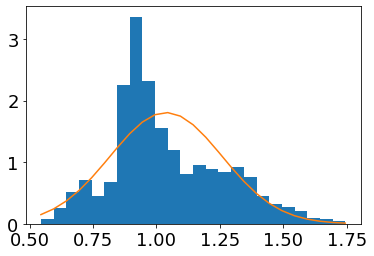

KstestResult(statistic=0.10876343950368528, pvalue=1.3925367184835603e-98)


In [40]:
normality_test(m_magnetometer, "Magnetometer")

- Como o valor de p é sempre inferior a 5% e praticamente nulo, rejeitamos a hipótese nula, de que os dados são distribuidos normalmente, logo iremos escolher um teste estatístico não paramétrico. Visto que as variáveis são contínuas e temos 3 features, iremos escolher o teste de Friedman, o qual não requer que os dados sejam normalmente distribuídos.

## Friedman Test (Teste Estatístico)

In [41]:
def friedman_test(var1, var2, var3):
    for i in range(len(var1)):
        print(f"----- {activity_labels[i]} -----")
        print(stats.friedmanchisquare(var1[i], var2[i], var3[i]))

In [42]:
friedman_test(m_acceleration, m_gyroscope, m_magnetometer)

----- Stand -----
FriedmanchisquareResult(statistic=1177322.8848364018, pvalue=0.0)
----- Sit -----
FriedmanchisquareResult(statistic=637512.615457979, pvalue=0.0)
----- Sit and Talk -----
FriedmanchisquareResult(statistic=611581.442582543, pvalue=0.0)
----- Walk -----
FriedmanchisquareResult(statistic=1318287.3334448542, pvalue=0.0)
----- Walk and Talk -----
FriedmanchisquareResult(statistic=1333023.0356652625, pvalue=0.0)
----- Climb Stair -----
FriedmanchisquareResult(statistic=881466.0662394073, pvalue=0.0)
----- Climb Stair & talk -----
FriedmanchisquareResult(statistic=441018.5195470904, pvalue=0.0)
----- Stand to Sit -----
FriedmanchisquareResult(statistic=30904.549845041358, pvalue=0.0)
----- Sit to Stand -----
FriedmanchisquareResult(statistic=33619.63555936073, pvalue=0.0)
----- Stand to Sit & talk -----
FriedmanchisquareResult(statistic=31985.486044337624, pvalue=0.0)
----- Sit to Stand & talk -----
FriedmanchisquareResult(statistic=34916.84367897728, pvalue=0.0)
----- Stand

- Como a hipótese nula do firedman test diz que observações repetidas dos mesmo indivíduos têm a mesma distribuição e o pvalue é 0 para cada atividade, então as 3 técnicas de medição não são consistentes.

# Exercício 4.2

## Features Estatísticas

In [199]:
# https://raphaelvallat.com/entropy/build/html/generated/entropy.spectral_entropy.html
def spectral_entropy(feat,fs):
    var,psd = signal.periodogram(feat,fs)
    result = - sum([psd[i]*np.log2(psd[i]) for i in range(0,fs//2)])
    result = result/np.log2(psd.size)
    return result

def zcr(feat, window_length):
    return (((feat[:-1] * feat[1:]) < 0).sum())/window_length

## Features Físicas

- Como segundo o artigo, é redundante usar ambas as features SMA e AI, pois são muito equivalentes, apenas computamos a AI.

In [310]:
def mi(feat):
    return np.sqrt(feat[:,0]**2 + feat[:,1]**2 + feat[:,2]**2)

def ai(mi_vals):
    return np.mean(mi_vals)

def vi(mi_vals, ai_val):
    vals = mi_vals-ai_val
    return np.mean(vals**2)

def eva(feat):
    eigvals = np.linalg.eigvals(np.cov(feat))
    return [eigvals[0], eigvals[2]]

def cagh(feat):
    heading_dir = np.sqrt(feat[:, 1]**2 + feat[:, 2]**2)
    return np.corrcoef(feat[:, 0], heading_dir)[0,1]

def avh(feat, total_time):
    mean_y = np.mean(feat[:, 1])
    mean_z = np.mean(feat[:, 2])
    return np.sqrt((total_time*mean_y)**2 + (total_time*mean_z)**2)

def avg(feat):
    return np.mean(np.trapz(feat[:,0]))

def aratg(feat, window_length):
    return np.cumsum(feat[:, 0])[-1]/window_length

def fft(feat):
    return np.fft.fft(feat)

def df(feat):    
    return np.argmax(fft(feat)**2)

def energy(feat, window_length):
    return np.sum(np.abs(fft(feat))**2)/window_length

def aae(energy_accel):
    return np.mean(energy_accel)

def are(energy_gyros):
    return np.mean(energy_gyros)

In [193]:
data_total = data[0]

for i in range(1, len(data)):
    data_total = np.concatenate((data_total, data[i]), axis=0)
    
accel_total = data_total[:, 1:4]
gyros_total = data_total[:, 4:7]
magnet_total = data_total[:, 7:10]

In [142]:
dfs = [df(accel_total[:,0]), df(accel_total[:,1]), df(accel_total[:,2]), 
       df(gyros_total[:,0]), df(gyros_total[:,1]), df(gyros_total[:,2]), 
       df(magnet_total[:,0]), df(magnet_total[:,1]), df(magnet_total[:,2])]
dfs

[15, 0, 0, 3874343, 4, 30, 0, 0, 0]

In [136]:
fs = 2 * max(dfs)
t = 1/fs
2/t > len(data_total)

True

- Como a maior frequência dominante é demasiado grande para ter uma janela de um bom tamanho, iremos usar a 2a maior.

In [151]:
fs = 2 * dfs[5]
t = 1/fs

In [312]:
def feature_set(T, overlap):
    
    window_length = int(T/t)
    step = int(window_length * overlap)
    
    feats_per_window = []

    for i in range(0, len(data_total) - window_length, step):
        mi_vals = mi(accel_total[i:i+window_length])
        ai_val = ai(mi_vals)
        eva_vals = eva(accel_total[i:i+window_length])
        
        energy_accel_x = energy(accel_total[i:i+window_length,0], window_length)
        energy_accel_y = energy(accel_total[i:i+window_length,1], window_length)
        energy_accel_z = energy(accel_total[i:i+window_length,2], window_length)
        energy_gyros_x = energy(gyros_total[i:i+window_length,0], window_length)
        energy_gyros_y = energy(gyros_total[i:i+window_length,1], window_length)
        energy_gyros_z = energy(gyros_total[i:i+window_length,2], window_length)
        
        feats_per_window.append([np.mean(accel_total[i:i+window_length,0]),
                                 np.mean(accel_total[i:i+window_length,1]),
                                 np.mean(accel_total[i:i+window_length,2]),
                                 np.mean(gyros_total[i:i+window_length,0]),
                                 np.mean(gyros_total[i:i+window_length,1]),
                                 np.mean(gyros_total[i:i+window_length,2]),
                                 np.mean(magnet_total[i:i+window_length,0]),
                                 np.mean(magnet_total[i:i+window_length,1]),
                                 np.mean(magnet_total[i:i+window_length,2]),
                                 np.median(accel_total[i:i+window_length,0]),
                                 np.median(accel_total[i:i+window_length,1]),
                                 np.median(accel_total[i:i+window_length,2]),
                                 np.median(gyros_total[i:i+window_length,0]),
                                 np.median(gyros_total[i:i+window_length,1]),
                                 np.median(gyros_total[i:i+window_length,2]),
                                 np.median(magnet_total[i:i+window_length,0]),
                                 np.median(magnet_total[i:i+window_length,1]),
                                 np.median(magnet_total[i:i+window_length,2]),
                                 np.std(accel_total[i:i+window_length,0]),
                                 np.std(accel_total[i:i+window_length,1]),
                                 np.std(accel_total[i:i+window_length,2]),
                                 np.std(gyros_total[i:i+window_length,0]),
                                 np.std(gyros_total[i:i+window_length,1]),
                                 np.std(gyros_total[i:i+window_length,2]),
                                 np.std(magnet_total[i:i+window_length,0]),
                                 np.std(magnet_total[i:i+window_length,1]),
                                 np.std(magnet_total[i:i+window_length,2]),
                                 stats.iqr(accel_total[i:i+window_length,0]),
                                 stats.iqr(accel_total[i:i+window_length,1]),
                                 stats.iqr(accel_total[i:i+window_length,2]),
                                 stats.iqr(gyros_total[i:i+window_length,0]),
                                 stats.iqr(gyros_total[i:i+window_length,1]),
                                 stats.iqr(gyros_total[i:i+window_length,2]),
                                 stats.iqr(magnet_total[i:i+window_length,0]),
                                 stats.iqr(magnet_total[i:i+window_length,1]),
                                 stats.iqr(magnet_total[i:i+window_length,2]),
                                 stats.skew(accel_total[i:i+window_length,0]),
                                 stats.skew(accel_total[i:i+window_length,1]),
                                 stats.skew(accel_total[i:i+window_length,2]),
                                 stats.skew(gyros_total[i:i+window_length,0]),
                                 stats.skew(gyros_total[i:i+window_length,1]),
                                 stats.skew(gyros_total[i:i+window_length,2]),
                                 stats.skew(magnet_total[i:i+window_length,0]),
                                 stats.skew(magnet_total[i:i+window_length,1]),
                                 stats.skew(magnet_total[i:i+window_length,2]),
                                 stats.kurtosis(accel_total[i:i+window_length,0]),
                                 stats.kurtosis(accel_total[i:i+window_length,1]),
                                 stats.kurtosis(accel_total[i:i+window_length,2]),
                                 stats.kurtosis(gyros_total[i:i+window_length,0]),
                                 stats.kurtosis(gyros_total[i:i+window_length,1]),
                                 stats.kurtosis(gyros_total[i:i+window_length,2]),
                                 stats.kurtosis(magnet_total[i:i+window_length,0]),
                                 stats.kurtosis(magnet_total[i:i+window_length,1]),
                                 stats.kurtosis(magnet_total[i:i+window_length,2]),
                                 zcr(accel_total[i:i+window_length,0], window_length),
                                 zcr(accel_total[i:i+window_length,1], window_length),
                                 zcr(accel_total[i:i+window_length,2], window_length),
                                 zcr(gyros_total[i:i+window_length,0], window_length),
                                 zcr(gyros_total[i:i+window_length,1], window_length),
                                 zcr(gyros_total[i:i+window_length,2], window_length),
                                 zcr(magnet_total[i:i+window_length,0], window_length),
                                 zcr(magnet_total[i:i+window_length,1], window_length),
                                 zcr(magnet_total[i:i+window_length,2], window_length),
                                 spectral_entropy(accel_total[i:i+window_length,0], fs), 
                                 spectral_entropy(accel_total[i:i+window_length,1], fs), 
                                 spectral_entropy(accel_total[i:i+window_length,2], fs), 
                                 spectral_entropy(gyros_total[i:i+window_length,0], fs), 
                                 spectral_entropy(gyros_total[i:i+window_length,1], fs), 
                                 spectral_entropy(gyros_total[i:i+window_length,2], fs), 
                                 spectral_entropy(magnet_total[i:i+window_length,0], fs), 
                                 spectral_entropy(magnet_total[i:i+window_length,1], fs), 
                                 spectral_entropy(magnet_total[i:i+window_length,2], fs),
                                 ai_val,
                                 vi(mi_vals, ai_val), 
                                 eva_vals[0], 
                                 eva_vals[1], 
                                 cagh(accel_total[i:i+window_length]), 
                                 avh(accel_total[i:i+window_length],2), 
                                 avg(accel_total[i:i+window_length]), 
                                 aratg(gyros_total[i:i+window_length], window_length), 
                                 df(accel_total[i:i+window_length,0]), 
                                 df(accel_total[i:i+window_length,1]), 
                                 df(accel_total[i:i+window_length,2]), 
                                 df(gyros_total[i:i+window_length,0]), 
                                 df(gyros_total[i:i+window_length,1]), 
                                 df(gyros_total[i:i+window_length,2]), 
                                 df(magnet_total[i:i+window_length,0]), 
                                 df(magnet_total[i:i+window_length,1]), 
                                 df(magnet_total[i:i+window_length,2]), 
                                 energy_accel_x, 
                                 energy_accel_y, 
                                 energy_accel_z, 
                                 energy_gyros_x, 
                                 energy_gyros_y, 
                                 energy_gyros_z, 
                                 energy(magnet_total[i:i+window_length,0], window_length), 
                                 energy(magnet_total[i:i+window_length,1], window_length), 
                                 energy(magnet_total[i:i+window_length,2], window_length), 
                                 aae([energy_accel_x, energy_accel_y, energy_accel_z]), 
                                 are([energy_gyros_x, energy_gyros_y, energy_gyros_z])])
    return feats_per_window

def normalize_feats(data):
    
    for column in data:
        data[column] = (data[column] - data[column].mean())/data[column].std()
    
    return data

In [313]:
T = 2
overlap = 1/2

feats_per_window = feature_set(T, overlap)

/var/folders/l1/lvj4fpw17pxdh5qx8mkkgzkw0000gn/T/ipykernel_902/1284826436.py:4: RuntimeWarning: divide by zero encountered in log2
  result = - sum([psd[i]*np.log2(psd[i]) for i in range(0,fs//2)])
/var/folders/l1/lvj4fpw17pxdh5qx8mkkgzkw0000gn/T/ipykernel_902/1284826436.py:4: RuntimeWarning: invalid value encountered in double_scalars
  result = - sum([psd[i]*np.log2(psd[i]) for i in range(0,fs//2)])


In [314]:
feats_per_window = pd.DataFrame(feats_per_window)

- Normalizamos as features para que todas se encontrem na mesma escala.

In [315]:
feats_per_window_norm = normalize_feats(feats_per_window)

In [319]:
feats_per_window_norm

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.870435,0.308539,0.214043,-0.190694,-0.083487,0.000198,-0.603271,0.036543,0.959679,-0.855479,...,0.131477,-0.405222,-0.535088,-0.724324,-0.496416,-0.620137,-0.652663,0.651671,-0.607815,-0.740086
1,-0.891587,0.297315,0.249343,-0.098440,-0.085415,-0.013854,-0.604192,0.003629,0.969322,-0.885523,...,0.110123,-0.380565,-0.534932,-0.723885,-0.496427,-0.618918,-0.708507,0.670701,-0.601601,-0.739843
2,-0.871951,0.307964,0.218288,0.042723,-0.094550,0.027305,-0.565663,0.034908,0.964427,-0.866039,...,0.130356,-0.402170,-0.537832,-0.723530,-0.496765,-0.668494,-0.655114,0.660994,-0.604869,-0.740614
3,-0.847843,0.320471,0.186807,-0.128742,-0.086595,0.031442,-0.527021,0.063236,0.961750,-0.844778,...,0.154188,-0.424191,-0.536910,-0.722858,-0.496653,-0.718530,-0.606873,0.655669,-0.603761,-0.739996
4,-0.846036,0.309458,0.224536,-0.157039,-0.082133,0.037975,-0.542871,0.035192,0.970946,-0.854591,...,0.133203,-0.398200,-0.536514,-0.713320,-0.496510,-0.698282,-0.655426,0.673887,-0.602904,-0.735310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65508,-0.118066,0.363043,-1.155670,0.103772,-0.082459,0.055643,-0.305983,-0.220962,-1.714543,-0.103435,...,0.236276,-0.495444,-0.538610,-0.724929,-0.496745,-0.944434,-1.051089,-0.229483,-0.719368,-0.741471
65509,-0.110010,0.362743,-1.156557,0.102780,-0.082846,0.045641,-0.301830,-0.219796,-1.714713,-0.092156,...,0.235692,-0.494953,-0.538615,-0.724928,-0.496779,-0.947894,-1.049490,-0.229273,-0.719896,-0.741489
65510,-0.102666,0.363358,-1.157087,0.105011,-0.083171,0.059541,-0.301907,-0.215521,-1.714627,-0.086516,...,0.236887,-0.494658,-0.538607,-0.724926,-0.496724,-0.947781,-1.043689,-0.229390,-0.717414,-0.741457
65511,-0.084772,0.362797,-1.158642,0.103549,-0.083362,0.063431,-0.295679,-0.210752,-1.715480,-0.069257,...,0.235798,-0.493793,-0.538613,-0.724925,-0.496708,-0.952906,-1.037287,-0.228261,-0.718259,-0.741450


In [322]:
# https://www.youtube.com/watch?v=Lsue2gEM9D0
def exer_pca(data):
    
    #normalizar data
    scaled_data = preprocessing.scale(data.T)
    pca = PCA()
    
    #calcular os loading scores e a variacao de cada componente principal
    pca.fit(scaled_data)
    pca_coordinates = pca.transform(scaled_data)
    
    #plotar o grafico de acordo com loading scores and scaled data
    #calcular a percentagem de variação que cada principal componente tem
    var_per  = np.round(pca.explained_variance_ratio_*100,decimals = 1)
    x_values = ['PC'+ str(i) for i in range(1,len(var_per)+1)]

    x = np.arange(1,len(var_per)+1)
    plt.figure()
    plt.bar(x_values,height=var_per,tick_label = x_values)
    plt.ylabel("Percentagem da importancia")
    plt.xlabel("Componentes Principais")
    plt.xticks(rotation=90)

    pca_plot = pd.DataFrame(pca_coordinates,index = colunas,columns = x_values)
    return pca_coordinates,var_per

AttributeError: 'numpy.ndarray' object has no attribute 'PC1'

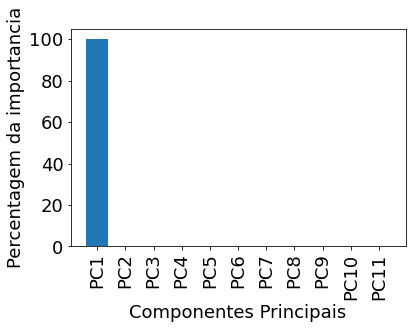

In [323]:
pca_coordinates,var_per = exer_pca(data_panda)

#plot duas melhores componentes principais
plt.scatter(pca_coordinates.PC1,pca_coordinates.PC2)
plt.xlabel("PC1 - {0}%",format(var_per[0]))
plt.xlabel("PC2 - {0}%",format(var_per[1]))

for i in pca_coordinates.index:
    plt.annotate(i,(pca_coordinates.PC1.loc[i],pca_coordinates.PC2.loc[i]))